# Computer Vision 2024 Assignment 1: Image filtering.

In this prac you will research, implement and test some image filtering operations. Image filtering by convolution is a fundamental step in many computer vision tasks and you will find it useful to have a firm grasp of how it works. For example, later in the course we will come across Convolutional Neural Networks (CNNs) which are built from convolutional image filters.

The main aims of the prac are:

- to understand the basics of how images are stored and processed in memory;
- to gain exposure to several common image filters, and understand how they work;
- to get practical experience implementing convolutional image filters;
- to test your intuition about image filtering by running some experiments;
- to report your results in a clear and concise manner.

*This assignment relates to the following ACS CBOK areas: abstraction, design, hardware and software, data and information, HCI and programming.*

## General instructions

Follow the instructions in this Python notebook and the accompanying file *a1code.py* to answer each question. It's your responsibility to make sure your answer to each question is clearly labelled and easy to understand. Note that most questions require some combination of Python code, graphical output, and text analysing or describing your results. Although we will check your code as needed, marks will be assigned based on the quality of your write up rather than for code correctness! This is not a programming test - we are more interested in your understanding of the topic.

Only a small amount of code is required to answer each question. We will make extensive use of the Python libraries

- [numpy](numpy.org) for mathematical functions
- [skimage](https://scikit-image.org) for image loading and processing
- [matplotlib](https://matplotlib.org/stable/index.html) for displaying graphical results
- [jupyter](https://jupyter.org) for Jupyter Notebooks

You should get familiar with the documentation for these libraries so that you can use them effectively.

# The Questions

To get started, below is some setup code to import the libraries we need. You should not need to edit it.

In [53]:
# Numpy is the main package for scientific computing with Python. 
import numpy as np

#from skimage import io

# Imports all the methods we define in the file a1code.py
from a1code import *

# Matplotlib is a useful plotting library for python 
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
default_figure_size = (10.0, 8.0)
plt.rcParams['figure.figsize'] = default_figure_size # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Question 0: Numpy warm up! (5%)

Before starting the assignment, make sure you have a working Python 3 installation, with up to date versions of the libraries mentioned above. If this is all new to you, I'd suggest  downloading an all in one Python installation such as [Anaconda](https://www.anaconda.com/products/individual). Alternatively you can use a Python package manager such as pip or conda, to get the libraries you need. If you're struggling with this please ask a question on the MyUni discussion forum.

For this assignment, you need some familiarity with numpy syntax. The numpy QuickStart should be enough to get you started:

https://numpy.org/doc/stable/user/quickstart.html

Here are a few warm up exercises to make sure you understand the basics. Answer them in the space below. Be sure to print the output of each question so we can see it!

1. Create a 1D numpy array Z with 12 elements. Fill with values 1 to 12.
2. Reshape Z into a 2D numpy array A with 3 rows and 4 columns.
3. Reshape Z into a 2D numpy array B with 4 rows and 3 columns.
4. Calculate the *matrix* product of A and B.
5. Calculate the *element wise* product of $A$ and $B^T$ (B transpose).


### Question 0.1

In [54]:
Z = np.arange(1, 13)
print(Z)

[ 1  2  3  4  5  6  7  8  9 10 11 12]


### Question 0.2

In [55]:
A = Z.reshape((3, 4))
print(A)

[[ 1  2  3  4]
 [ 5  6  7  8]
 [ 9 10 11 12]]


### Question 0.3

In [56]:
B = Z.reshape((4, 3))
print(B)

[[ 1  2  3]
 [ 4  5  6]
 [ 7  8  9]
 [10 11 12]]


### Question 0.4

In [57]:
matrix_product = A @ B
print(matrix_product)

[[ 70  80  90]
 [158 184 210]
 [246 288 330]]


### Question 0.5

In [58]:
element_wise_product = A * B.T
print(element_wise_product)

[[  1   8  21  40]
 [ 10  30  56  88]
 [ 27  60  99 144]]


You need to be comfortable with numpy arrays because that is how we store images. Let's do that next!

## Question 1: Loading and displaying an image (10%)

Below is a function to display an image using the pyplot module in matplotlib. Implement the `load()` and `print_stats()` functions in a1code.py so that the following code loads the mandrill image, displays it and prints its height, width and channel. 

In [59]:
def display(img, caption='', scale=None):
    # Show image using pyplot 
    plt.figure(figsize=(default_figure_size[0] * scale, default_figure_size[1] * scale) if scale else None)
    plt.imshow(img)
    plt.title(caption)
    plt.axis('off')
    plt.show()

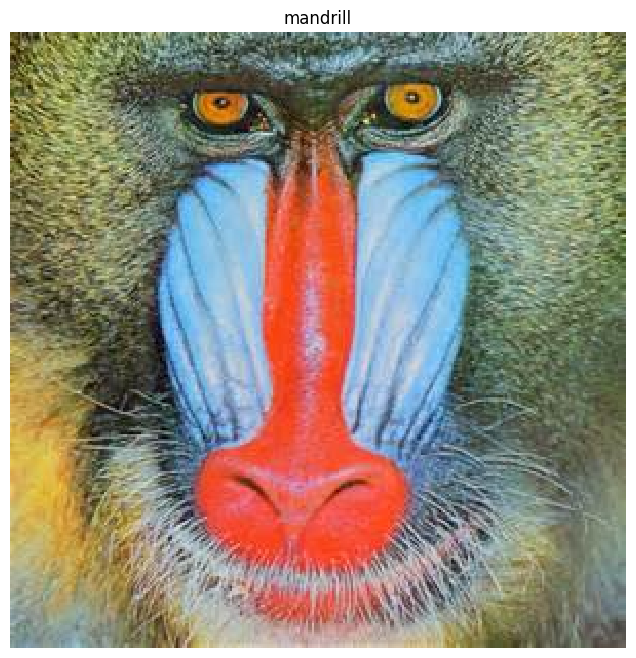

Image height is: 300, width is: 300, # channels is 3


In [60]:
image1 = load('images/mandrill.jpg')
display(image1, 'mandrill')
print_stats(image1)

Return to this question after reading through the rest of the assignment. Find 2 more images to use as test cases in this assignment for all the following questions and display them below. Use your print_stats() function to display their height, width and number of channels. Explain *why* you have chosen each image.

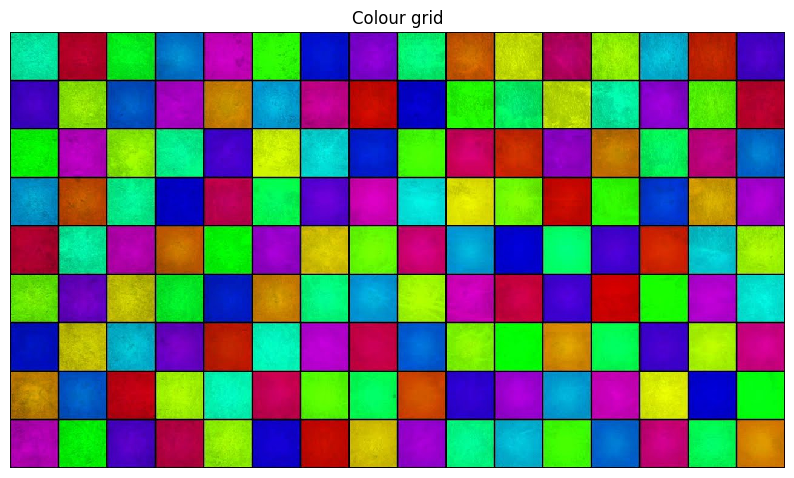

Image height is: 720, width is: 1280, # channels is 3


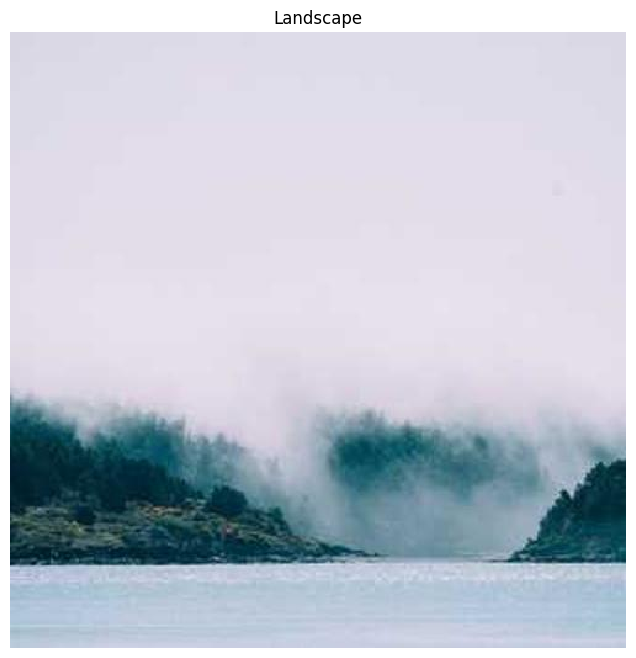

Image height is: 500, width is: 500, # channels is 3


In [61]:
### Load and display 2 more images
image2 = load("images/colour_grid.jpg")
display(image2, "Colour grid")
print_stats(image2)

image3 = load("images/landscape.jpg")
display(image3, "Landscape")
print_stats(image3)

#### Selection of images

Image 2 was chosen specifically because of it's multiple colours and how it would be good to verify the Sobel filters
are working correctly later in the assignment. It's grid structure means that there are very clear vertical and
horizontal features that should be displayed when applying the Sobel filters.

Image 3 was chosen because of it's clear distinction between land, sky and water. This would make verification of some
of the image processing like the binary function obvious, as the difference in colour should be shown.

## Question 2: Image processing (25%)

Now that you have an image stored as a numpy array, let's try some operations on it.

1. Implement the `crop()` function in a1code.py. Use array slicing to crop the image.
2. Implement the `resize()` function in a1code.py.
3. Implement the `change_contrast()` function in a1code.py.
4. Implement the `greyscale()` function in a1code.py.
5. Implement the `binary()` function in a1code.py.

What do you observe when you change the threshold of the binary function?

Apply all these functions with different parameters on your own test images.

### Question 2.4
In choosing a method to make the image greyscale, I came across an article that went through a number of different
methods. This article can be found at https://tannerhelland.com/2011/10/01/grayscale-image-algorithm-vb6.html and I
chose the method it describes which accounts for "correcting for the human eye". This was implemented by calculating a
value for each pixel based on a weighted sum for each of the red, green and blue channels. Since it is a weighted sum
based on each channel, the exact value can be calculated with matrix multiplication between the image and a vector of
shape (1, 3), resulting in a greyscale image matrix with only one channel.

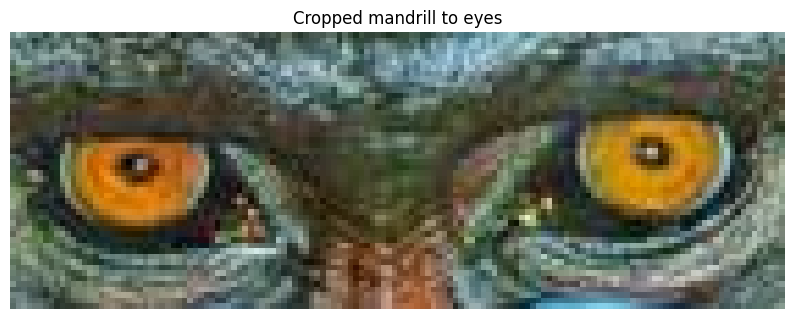

Image height is: 50, width is: 140, # channels is 3


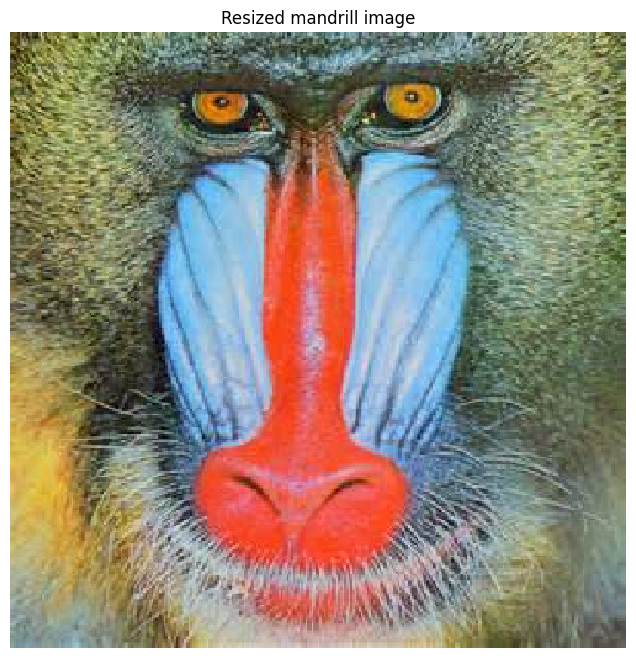

Image height is: 500, width is: 500, # channels is 3


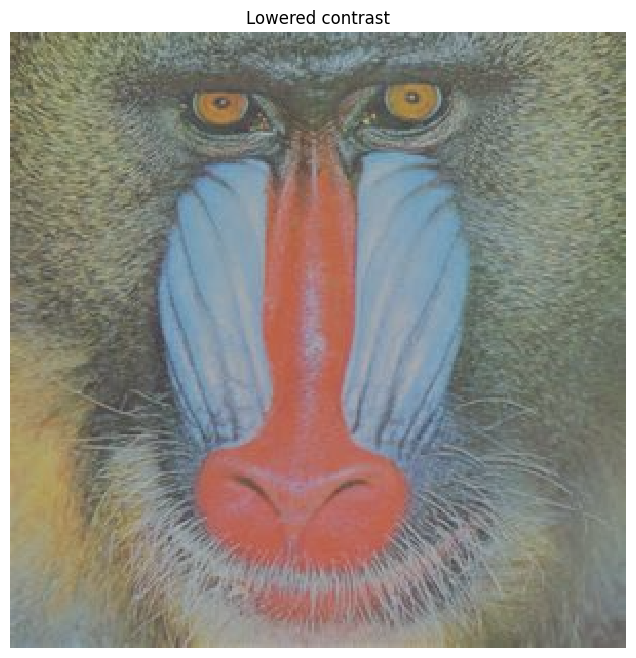

Image height is: 300, width is: 300, # channels is 3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.25..1.25].


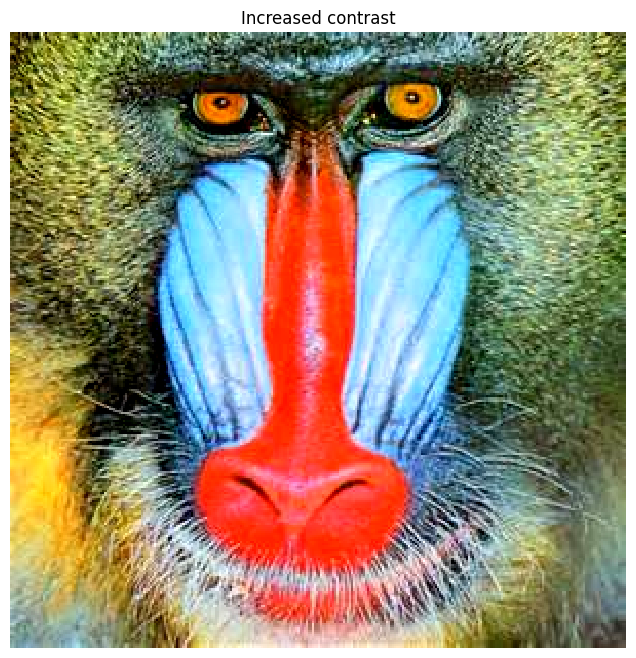

Image height is: 300, width is: 300, # channels is 3


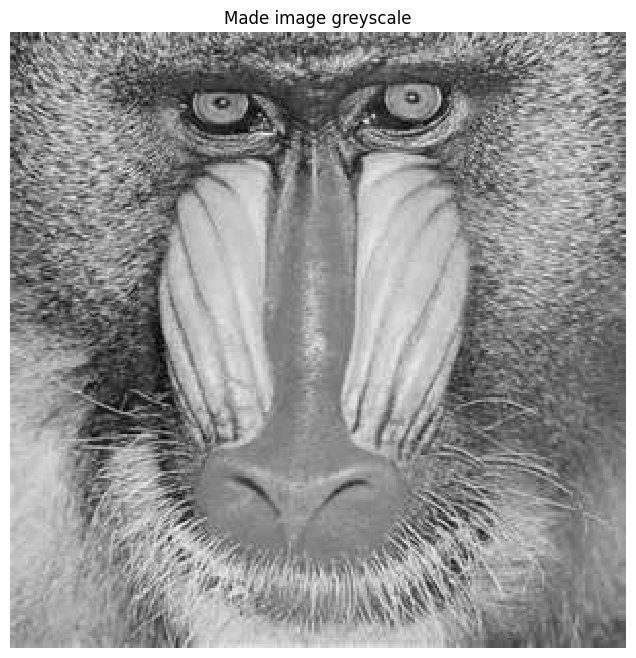

Image height is: 300, width is: 300, # channels is 1


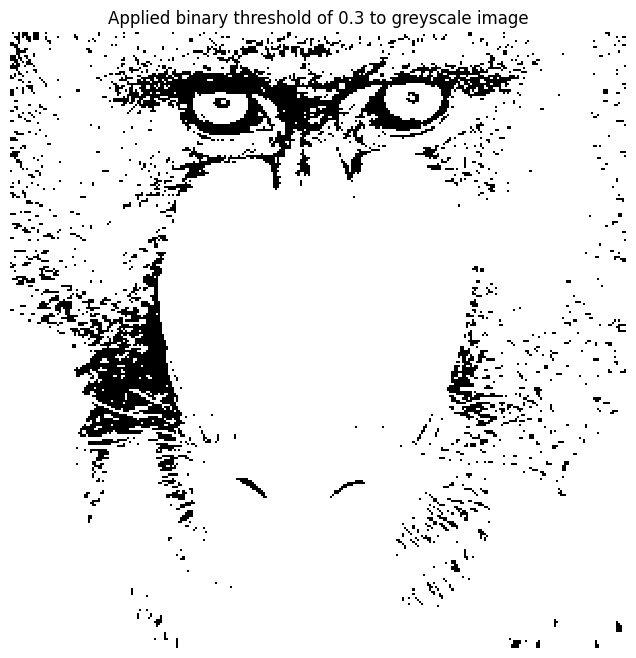

Image height is: 300, width is: 300, # channels is 1


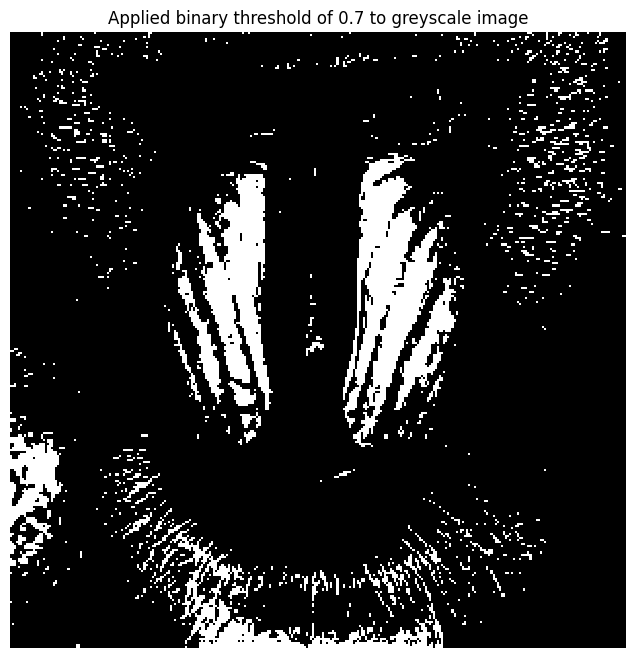

Image height is: 300, width is: 300, # channels is 1


In [62]:
crop_img = crop(image1, 10, 80, 50, 140)
display(crop_img, "Cropped mandrill to eyes") 
print_stats(crop_img)

resize_img = resize(image1, 500, 500)
display(resize_img, "Resized mandrill image")
print_stats(resize_img)

contrast_img = change_contrast(image1, 0.5)
display(contrast_img, "Lowered contrast")
print_stats(contrast_img)

contrast_img = change_contrast(image1, 1.5)
display(contrast_img, "Increased contrast")
print_stats(contrast_img)

grey_img = greyscale(image1)
display(grey_img, "Made image greyscale")
print_stats(grey_img)

binary_img = binary(grey_img, 0.3)
display(binary_img, "Applied binary threshold of 0.3 to greyscale image")
print_stats(binary_img)

binary_img = binary(grey_img, 0.7)
display(binary_img, "Applied binary threshold of 0.7 to greyscale image")
print_stats(binary_img)

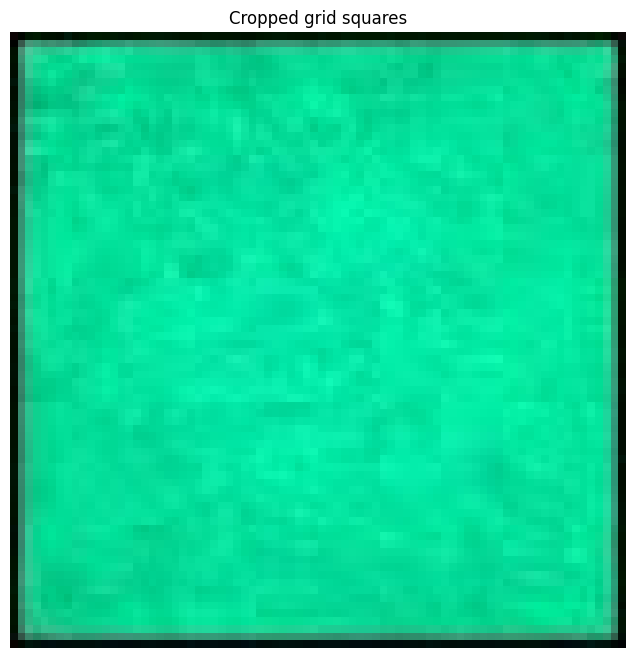

Image height is: 80, width is: 80, # channels is 3


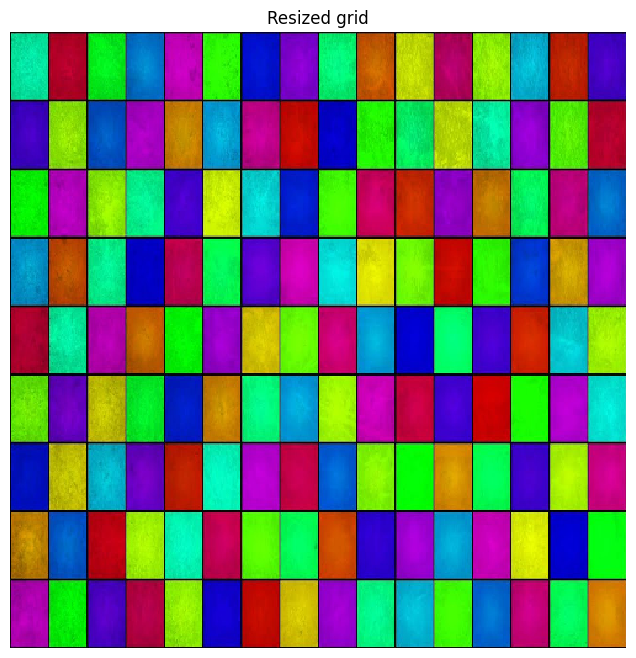

Image height is: 500, width is: 500, # channels is 3


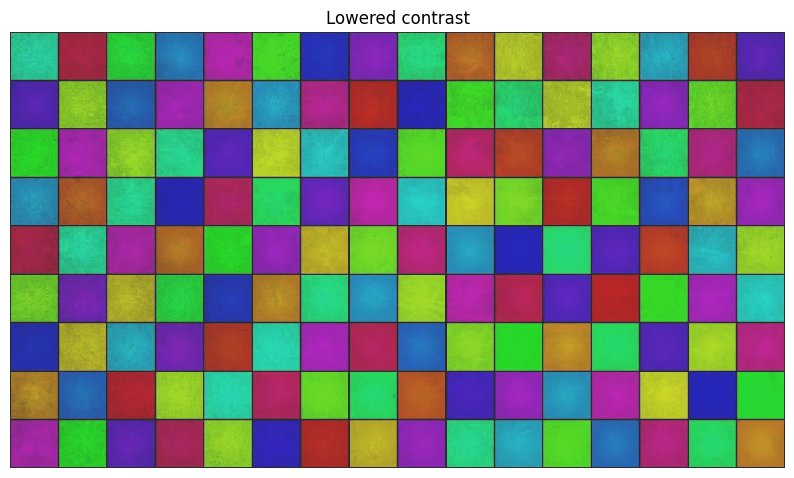

Image height is: 720, width is: 1280, # channels is 3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5..1.5].


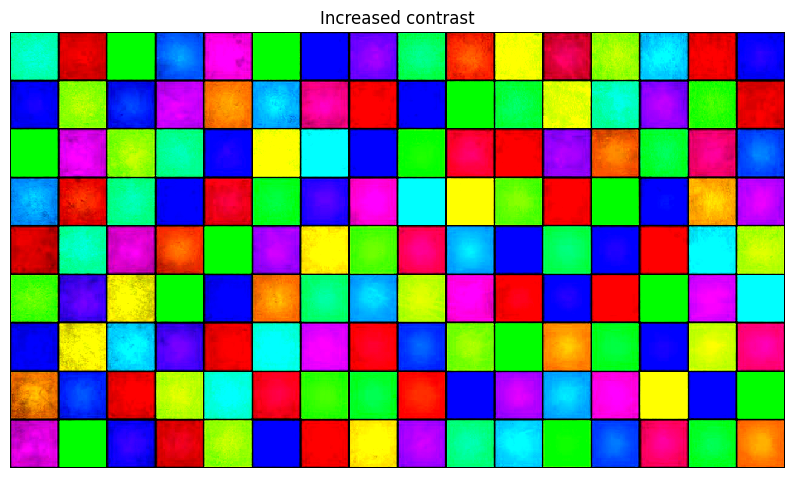

Image height is: 720, width is: 1280, # channels is 3


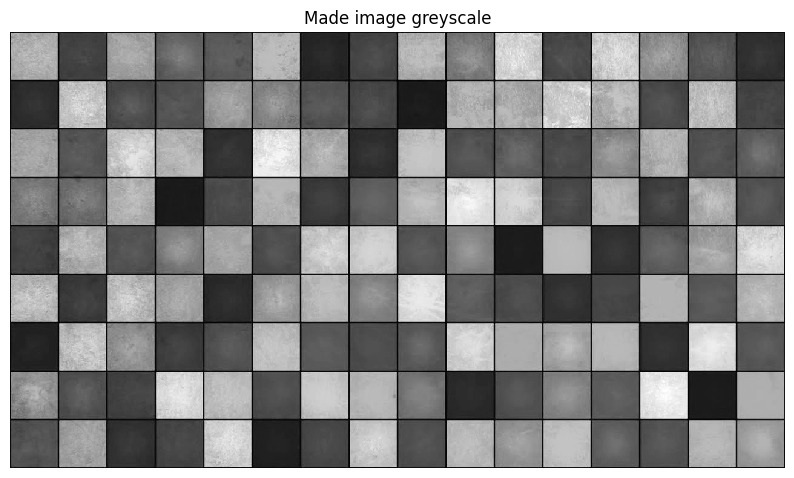

Image height is: 720, width is: 1280, # channels is 1


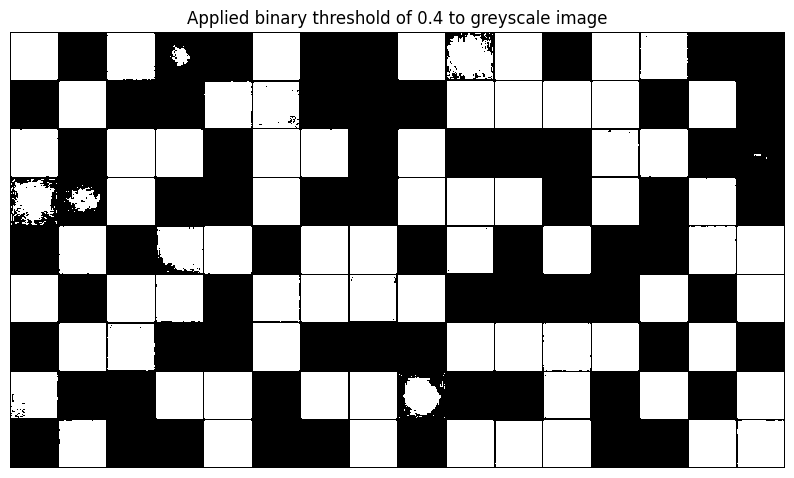

Image height is: 720, width is: 1280, # channels is 1


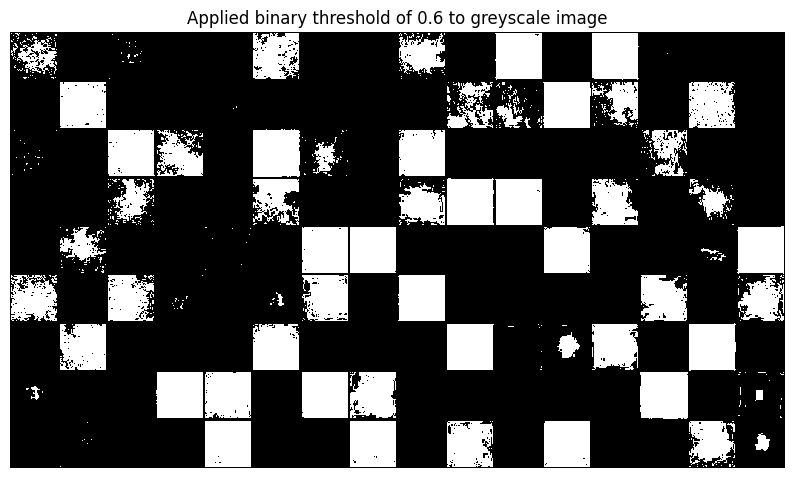

Image height is: 720, width is: 1280, # channels is 1


In [63]:
crop_img = crop(image2, 0, 0, 80, 80)
display(crop_img, "Cropped grid squares") 
print_stats(crop_img)

resize_img = resize(image2, 500, 500)
display(resize_img, "Resized grid")
print_stats(resize_img)

contrast_img = change_contrast(image2, 0.7)
display(contrast_img, "Lowered contrast")
print_stats(contrast_img)

contrast_img = change_contrast(image2, 2)
display(contrast_img, "Increased contrast")
print_stats(contrast_img)

grey_img = greyscale(image2)
display(grey_img, "Made image greyscale")
print_stats(grey_img)

binary_img = binary(grey_img, 0.4)
display(binary_img, "Applied binary threshold of 0.4 to greyscale image")
print_stats(binary_img)

binary_img = binary(grey_img, 0.6)
display(binary_img, "Applied binary threshold of 0.6 to greyscale image")
print_stats(binary_img)

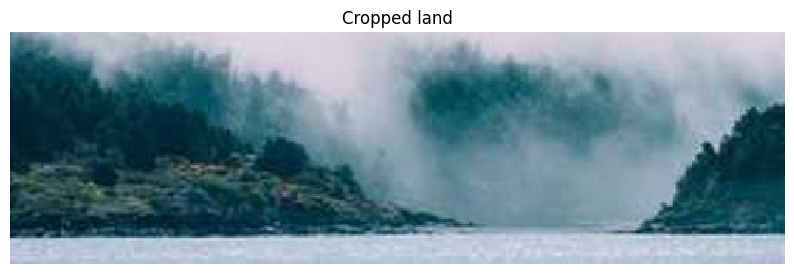

Image height is: 150, width is: 500, # channels is 3


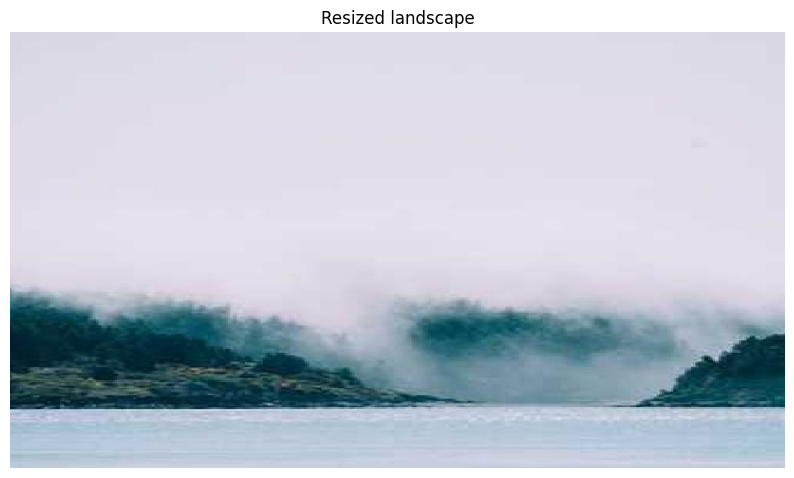

Image height is: 1080, width is: 1920, # channels is 3


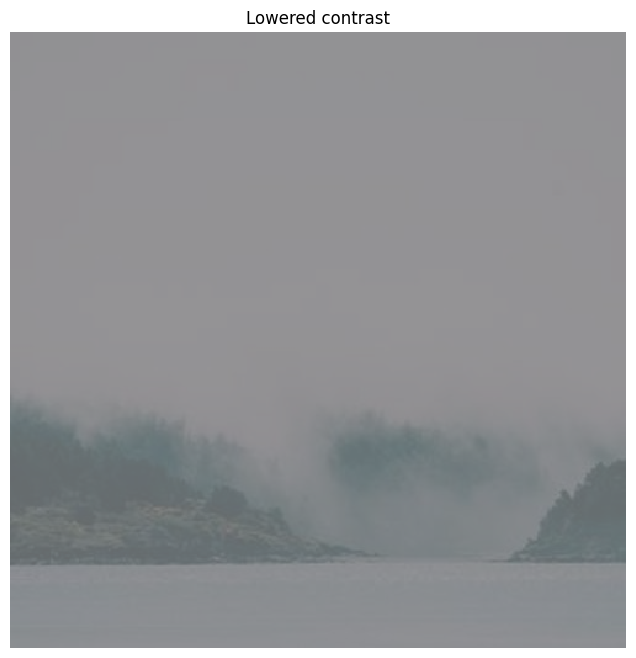

Image height is: 500, width is: 500, # channels is 3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.9058823529411764].


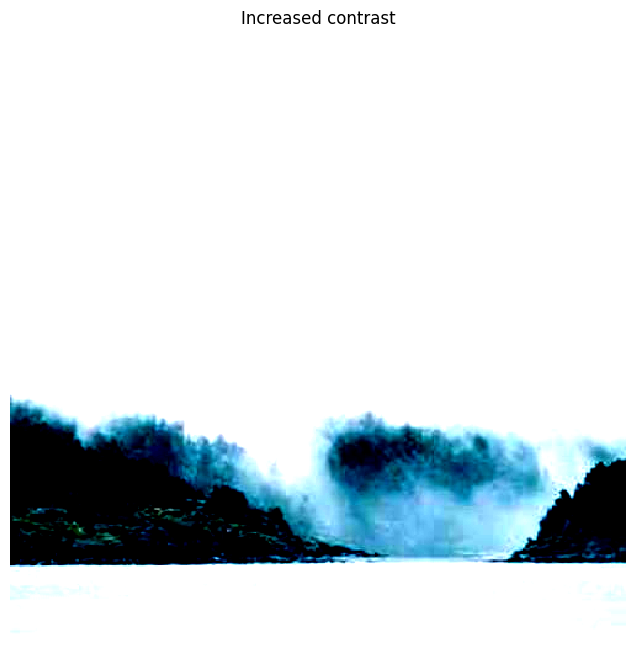

Image height is: 500, width is: 500, # channels is 3


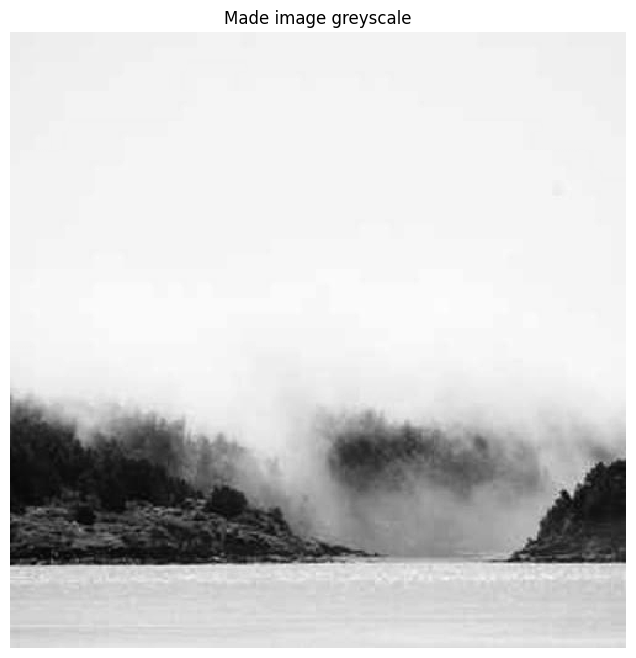

Image height is: 500, width is: 500, # channels is 1


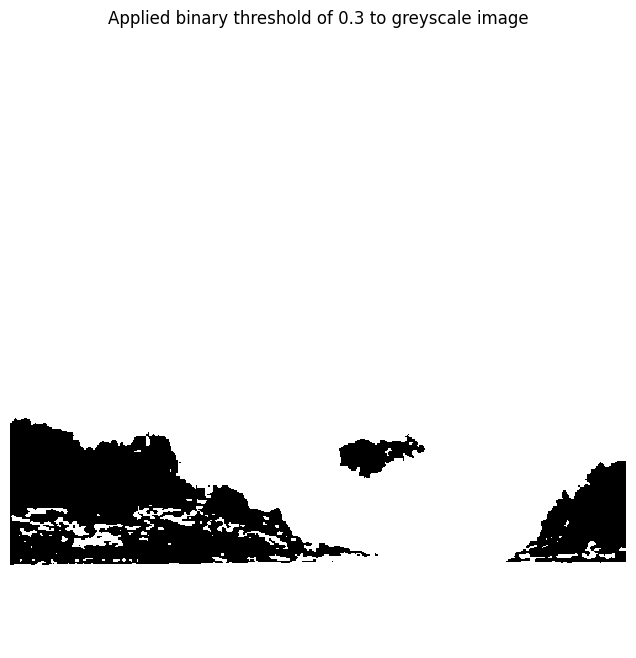

Image height is: 500, width is: 500, # channels is 1


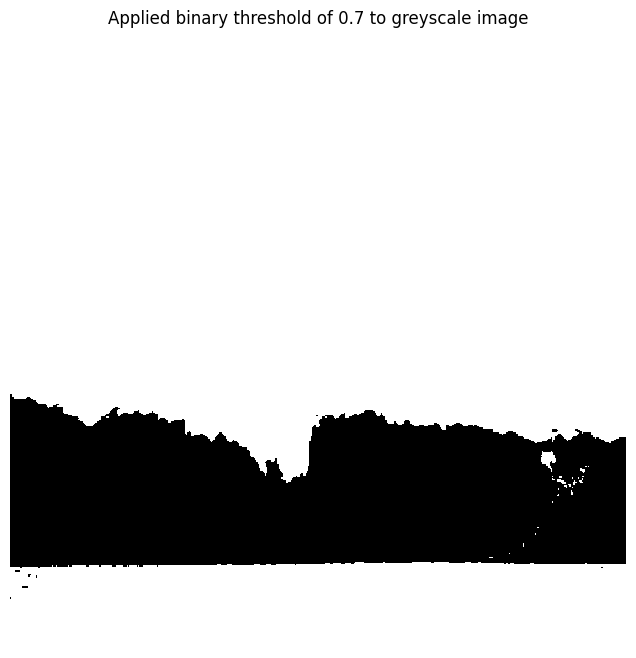

Image height is: 500, width is: 500, # channels is 1


In [64]:
crop_img = crop(image3, 300, 0, 150, 500)
display(crop_img, "Cropped land") 
print_stats(crop_img)

resize_img = resize(image3, 1080, 1920)
display(resize_img, "Resized landscape")
print_stats(resize_img)

contrast_img = change_contrast(image3, 0.2)
display(contrast_img, "Lowered contrast")
print_stats(contrast_img)

contrast_img = change_contrast(image3, 3)
display(contrast_img, "Increased contrast")
print_stats(contrast_img)

grey_img = greyscale(image3)
display(grey_img, "Made image greyscale")
print_stats(grey_img)

binary_img = binary(grey_img, 0.3)
display(binary_img, "Applied binary threshold of 0.3 to greyscale image")
print_stats(binary_img)

binary_img = binary(grey_img, 0.7)
display(binary_img, "Applied binary threshold of 0.7 to greyscale image")
print_stats(binary_img)

### Question 2

The operations on each of the images produces a new image with the operation applied. For the operations with
parameters, the different parameters result in an image produced with those changes. For example, the `change_contrast`
method results in an image with higher contrast if the parameter passed is greater than 1, or an image with lower
contrast if the parameter passed is less than 1.

The binary function returns an image that displays each pixel as black or white depending on if the source image pixel
in that position is over a certain threshold. The function is defined to display a white pixel (value = 1) if the input
pixel is over the threshold or black otherwise. Because of this, increasing the threshold means that more of the
resulting image is black, because less of the pixels in the image are over the threshold. Conversely, a lower threshold
means that more of the resulting image is white since more of the input pixels are over the threshold.

## Question 3: Convolution (25%)

### 3.1 2D convolution

Using the definition of 2D convolution from week 1, implement the convolution operation in the function `conv2D()` in a1code.py.


In [65]:
test_conv2D()

### 3.2 RGB convolution

In the function `conv` in a1code.py, extend your function `conv2D` to work on RGB images, by applying the 2D convolution to each channel independently. 

### Question 3.2

The `conv` function is implemented to apply the `conv2D` function to each channel of the RGB image.

### 3.3 Gaussian filter convolution

Use the `gauss2D` function provided in a1code.py to create a Gaussian kernel, and apply it to your images with convolution. You will obtain marks for trying different tests and analysing the results, for example:

- try varying the image size, and the size and variance of the filter  
- subtract the filtered image from the original - this gives you an idea of what information is lost when filtering

What do you observe and why?

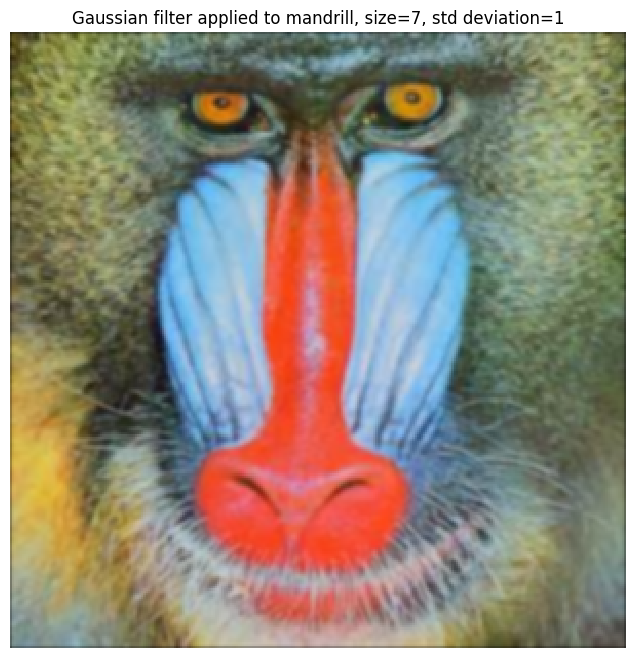

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.33838655764502024..0.4218792114204063].


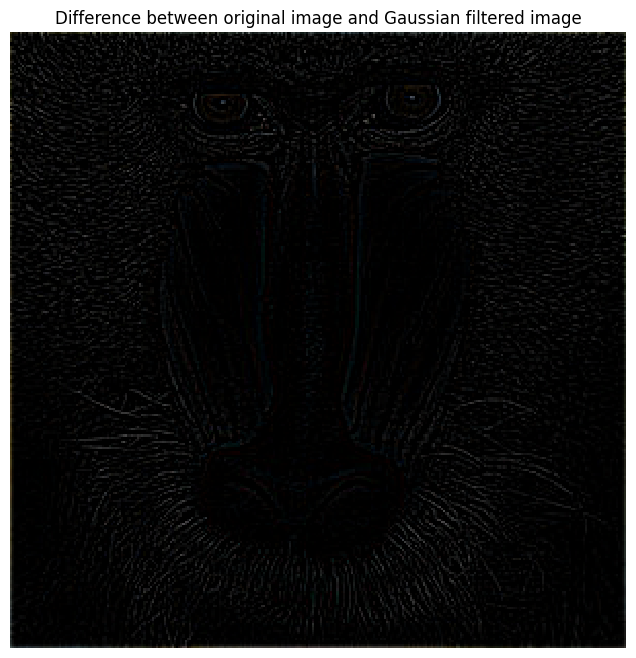

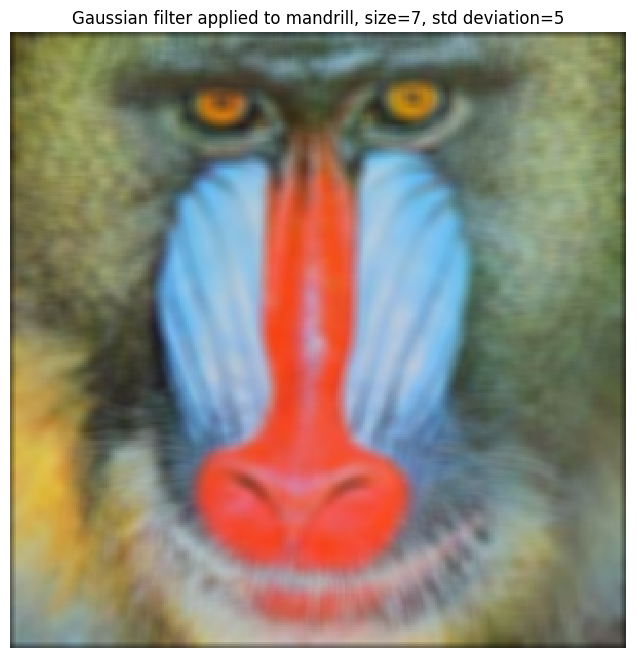

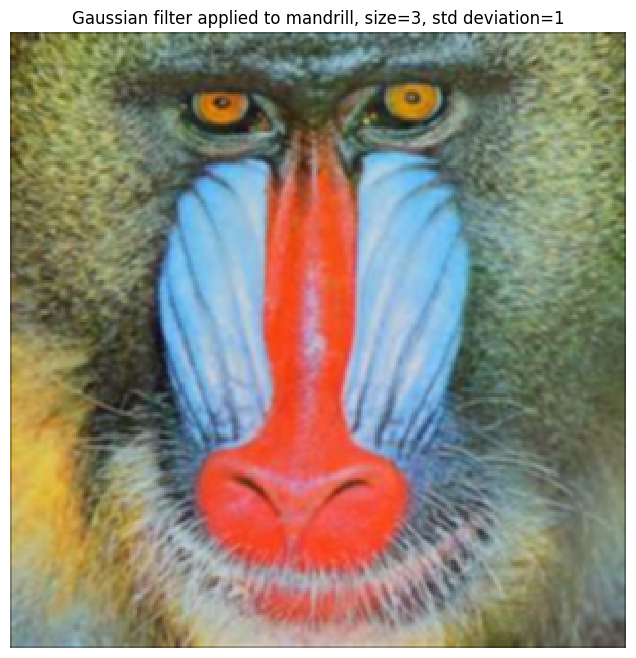

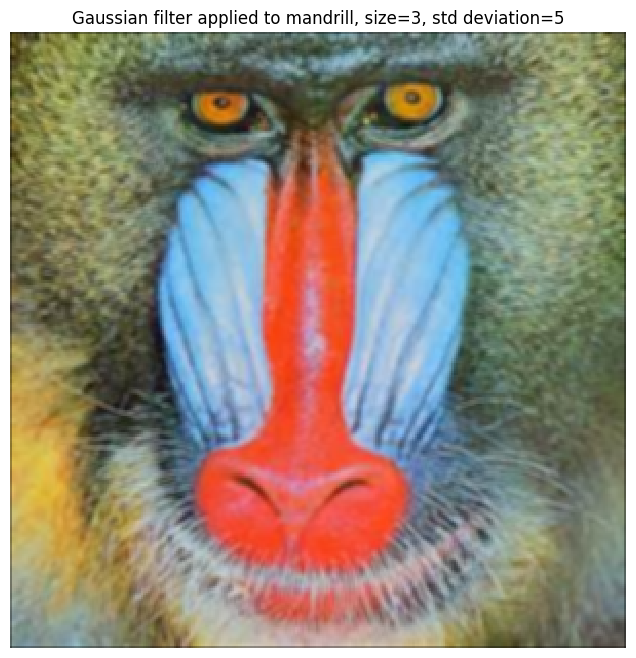

In [66]:
gauss_kernel = gauss2D(7, 1)
filtered_image = conv(image1, gauss_kernel)
display(filtered_image, "Gaussian filter applied to mandrill, size=7, std deviation=1")

display(image1 - filtered_image, "Difference between original image and Gaussian filtered image")

gauss_kernel = gauss2D(7, 5)
filtered_image = conv(image1, gauss_kernel)
display(filtered_image, "Gaussian filter applied to mandrill, size=7, std deviation=5")

gauss_kernel = gauss2D(3, 1)
filtered_image = conv(image1, gauss_kernel)
display(filtered_image, "Gaussian filter applied to mandrill, size=3, std deviation=1")

gauss_kernel = gauss2D(3, 5)
filtered_image = conv(image1, gauss_kernel)
display(filtered_image, "Gaussian filter applied to mandrill, size=3, std deviation=5")


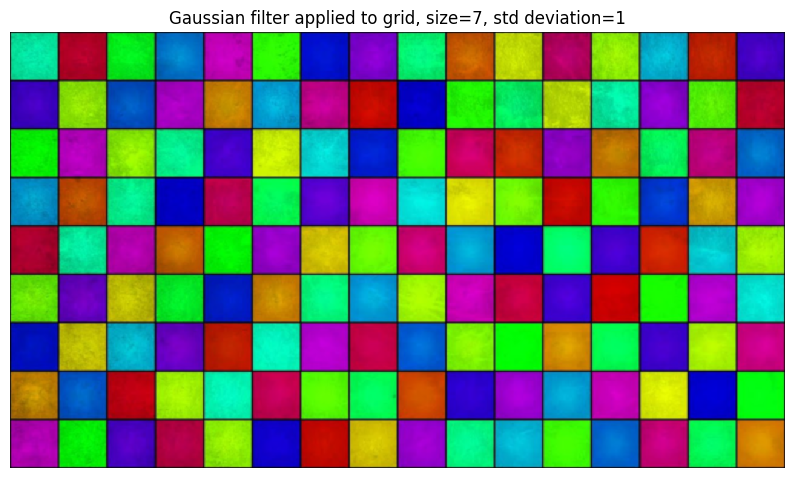

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.251362136211344..0.2345873570210772].


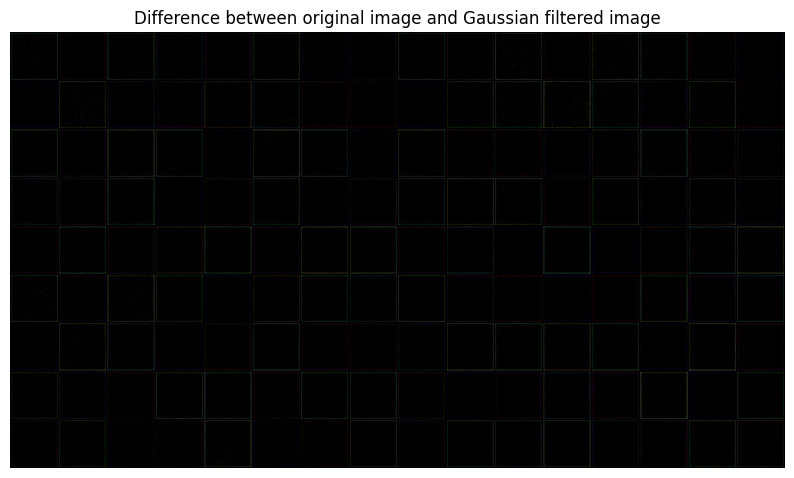

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000000000000002].


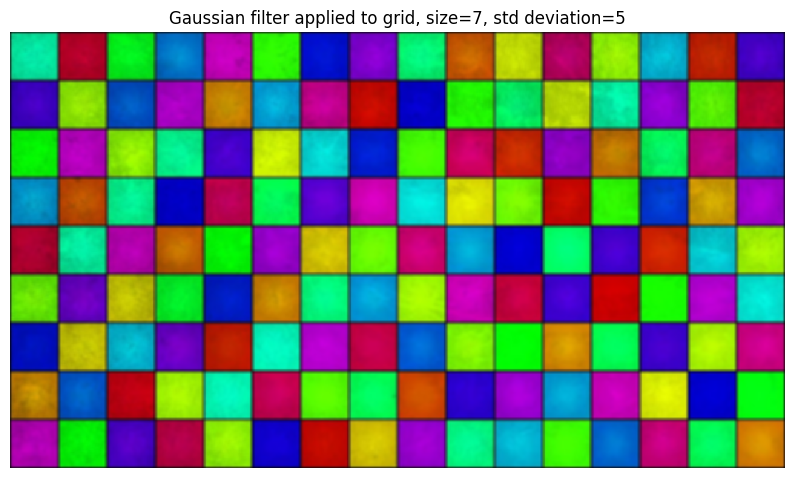

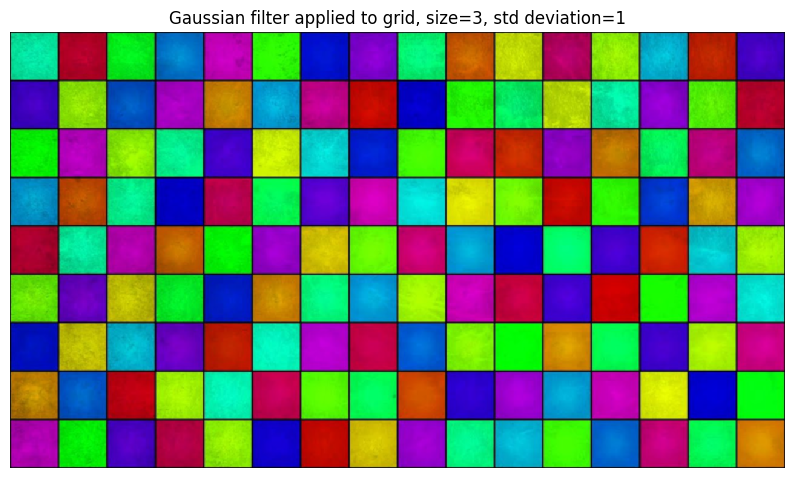

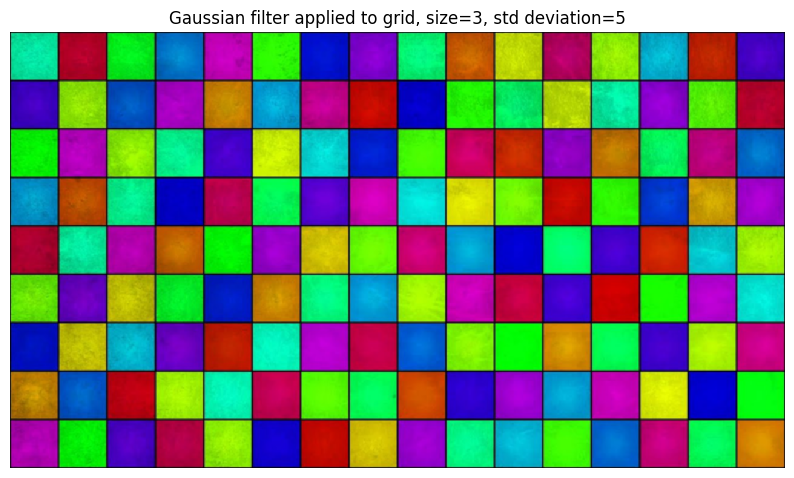

In [67]:
gauss_kernel = gauss2D(7, 1)
filtered_image = conv(image2, gauss_kernel)
display(filtered_image, "Gaussian filter applied to grid, size=7, std deviation=1")

display(image2 - filtered_image, "Difference between original image and Gaussian filtered image")

gauss_kernel = gauss2D(7, 5)
filtered_image = conv(image2, gauss_kernel)
display(filtered_image, "Gaussian filter applied to grid, size=7, std deviation=5")

gauss_kernel = gauss2D(3, 1)
filtered_image = conv(image2, gauss_kernel)
display(filtered_image, "Gaussian filter applied to grid, size=3, std deviation=1")

gauss_kernel = gauss2D(3, 5)
filtered_image = conv(image2, gauss_kernel)
display(filtered_image, "Gaussian filter applied to grid, size=3, std deviation=5")


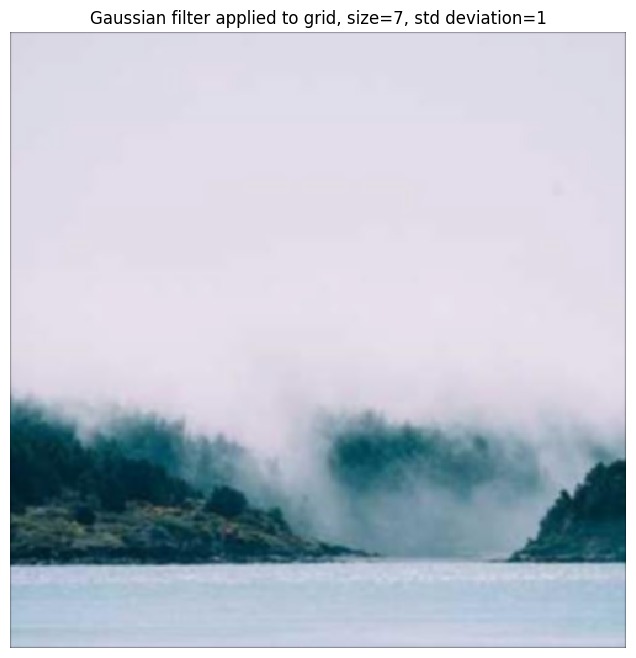

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16137642420069523..0.45859681778039696].


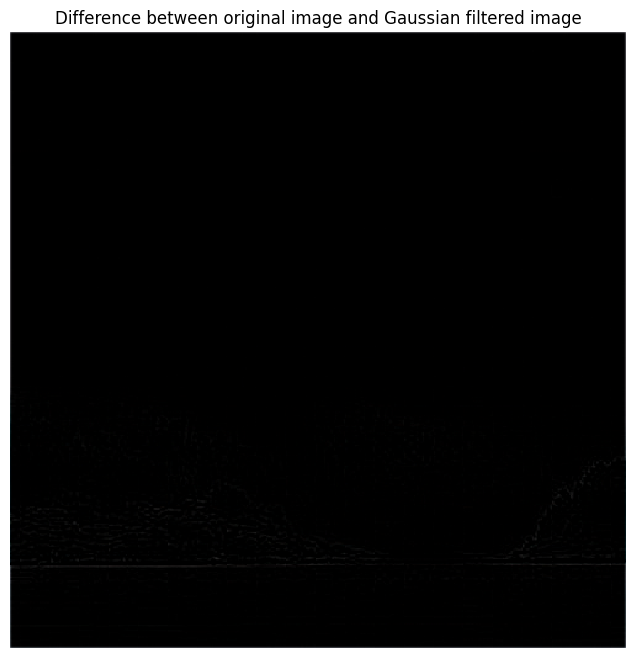

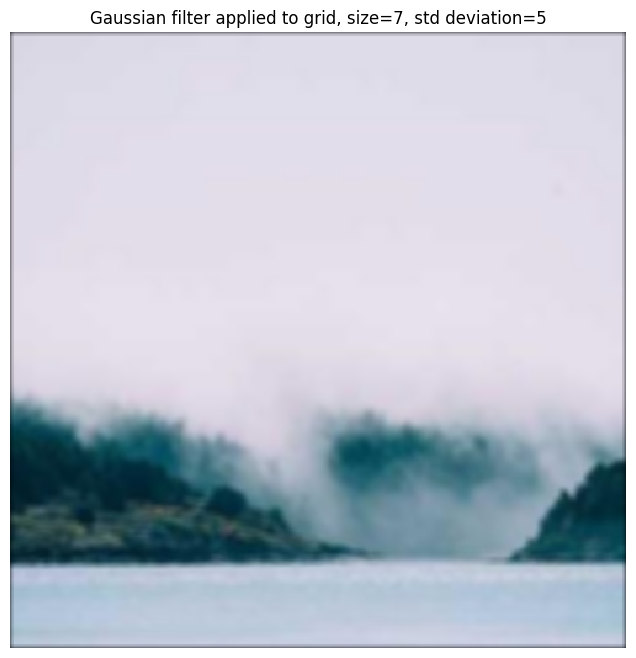

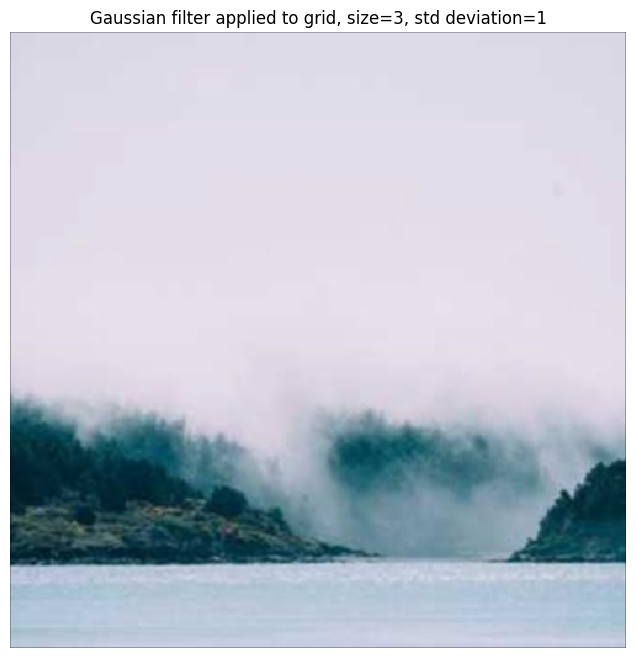

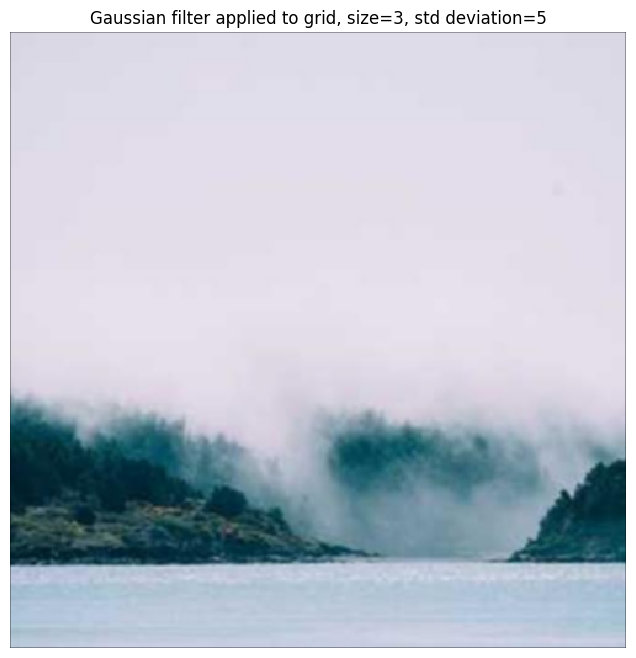

In [68]:
gauss_kernel = gauss2D(7, 1)
filtered_image = conv(image3, gauss_kernel)
display(filtered_image, "Gaussian filter applied to grid, size=7, std deviation=1")

display(image3 - filtered_image, "Difference between original image and Gaussian filtered image")

gauss_kernel = gauss2D(7, 5)
filtered_image = conv(image3, gauss_kernel)
display(filtered_image, "Gaussian filter applied to grid, size=7, std deviation=5")

gauss_kernel = gauss2D(3, 1)
filtered_image = conv(image3, gauss_kernel)
display(filtered_image, "Gaussian filter applied to grid, size=3, std deviation=1")

gauss_kernel = gauss2D(3, 5)
filtered_image = conv(image3, gauss_kernel)
display(filtered_image, "Gaussian filter applied to grid, size=3, std deviation=5")


### Question 3.3

After applying the Gaussian filter to an image, it is clear that the image is blurred more when the filter is of a
larger size. This is also the expected outcome, as it means that when the image is convoluted with the filter, more
pixels in the image are used as a part of the blurring. Whereas, when the filter is smaller, a smaller sample of
neighbouring pixels are used for the blurring.

The change is the standard deviation is also shown to increase the blurring as it increases. A higher standard deviation
means more blurring of the input image.

Based on the display of the difference between the origian image and the blurred image, it seems like the information
that is lost when applying the Gaussian blur is related to the sharp edges in the image. This is intuitive for a filter
that applies blurring to an image, since blurring implies that sharpness is reduced.

### 3.4 Sobel filters

Define a horizontal and vertical Sobel edge filter kernel and test them on your images. You will obtain marks for testing them and displaying results in interesting ways, for example:

- apply them to an image at different scales
- considering how to display positive and negative gradients
- apply different combinations of horizontal and vertical filters

In [69]:
# 3.4
horizontal_sobel_filter = np.array([
    [1, 0, -1],
    [2, 0, -2],
    [1, 0, -1],
])
vertical_sobel_filter = np.array([
    [ 1,  2,  1],
    [ 0,  0,  0],
    [-1, -2, -1],
])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.788235294117647..3.56078431372549].


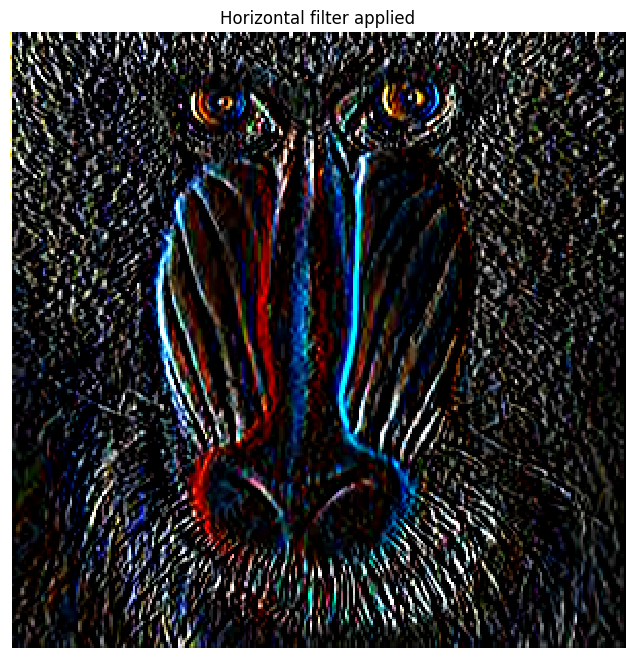

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.4..2.996078431372549].


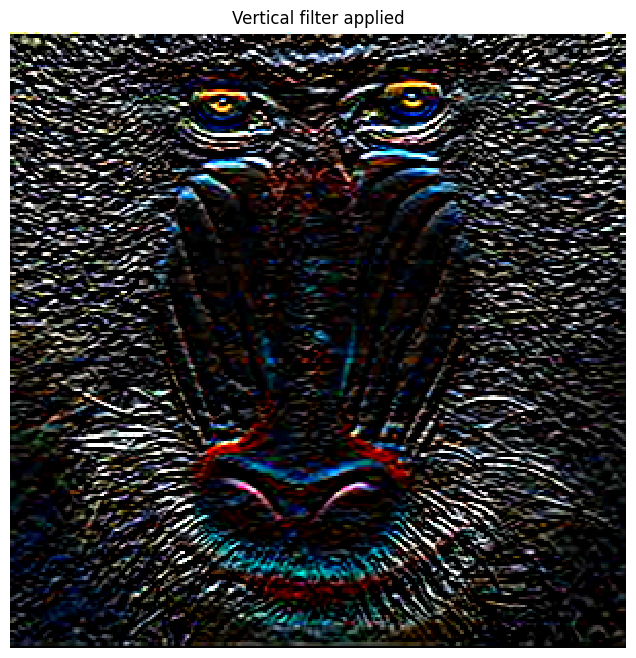

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.219607843137255..7.176470588235294].


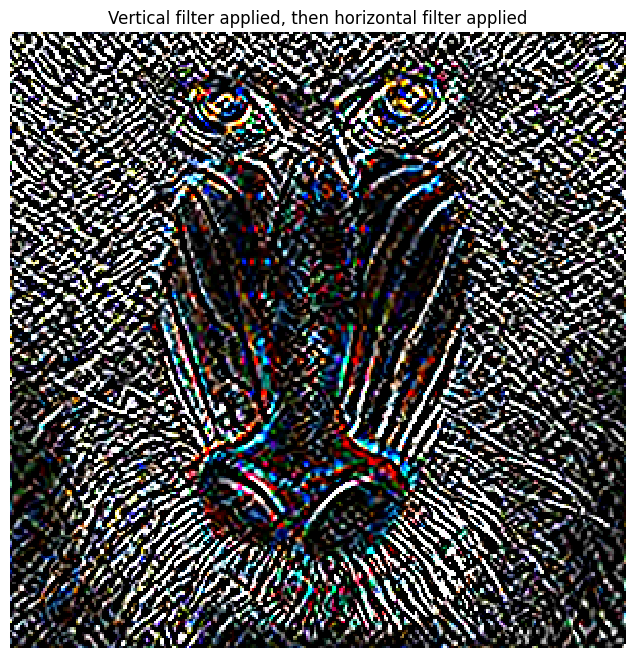

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.219607843137256..7.176470588235294].


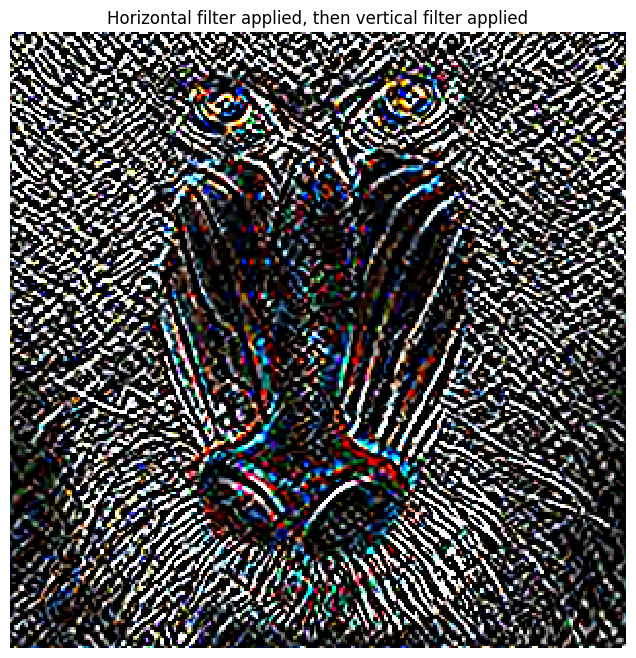

Application of horizontal filter then vertical filter results in the same image is False


In [70]:
out3_4 = conv(image1, horizontal_sobel_filter)
display(out3_4, "Horizontal filter applied")
out3_4 = conv(image1, vertical_sobel_filter)
display(out3_4, "Vertical filter applied")

out3_4 = conv(image1, vertical_sobel_filter)
out3_4 = conv(out3_4, horizontal_sobel_filter)
display(out3_4, "Vertical filter applied, then horizontal filter applied")
vertical_horizontal = out3_4

out3_4 = conv(image1, horizontal_sobel_filter)
out3_4 = conv(out3_4, vertical_sobel_filter)
display(out3_4, "Horizontal filter applied, then vertical filter applied")
horizontal_vertical = out3_4

print(f"Application of horizontal filter then vertical filter results in the same image is {np.array_equal(vertical_horizontal, horizontal_vertical)}")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.6823529411764704..3.6431372549019607].


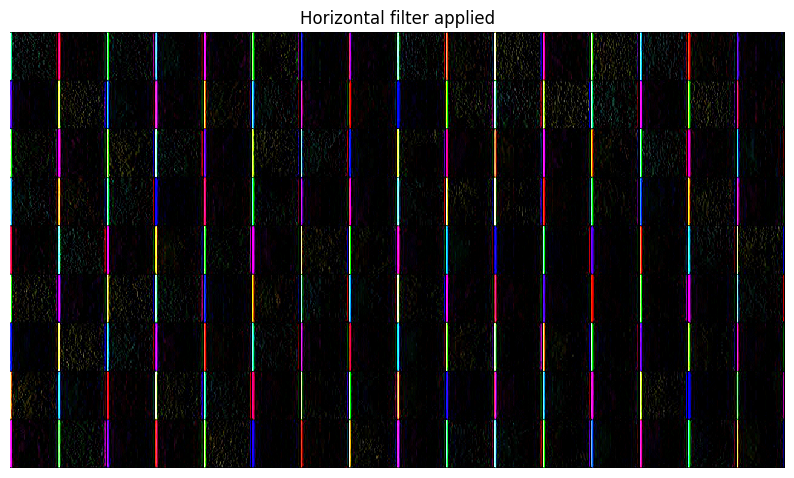

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.6784313725490194..3.764705882352941].


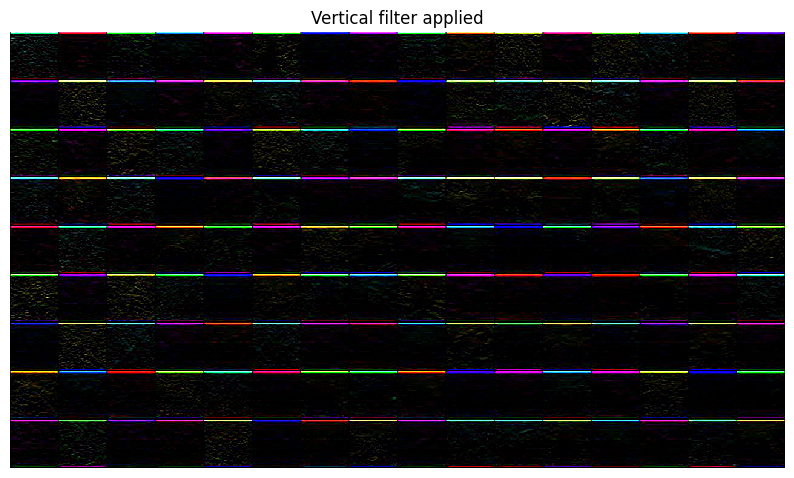

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.427450980392157..8.094117647058823].


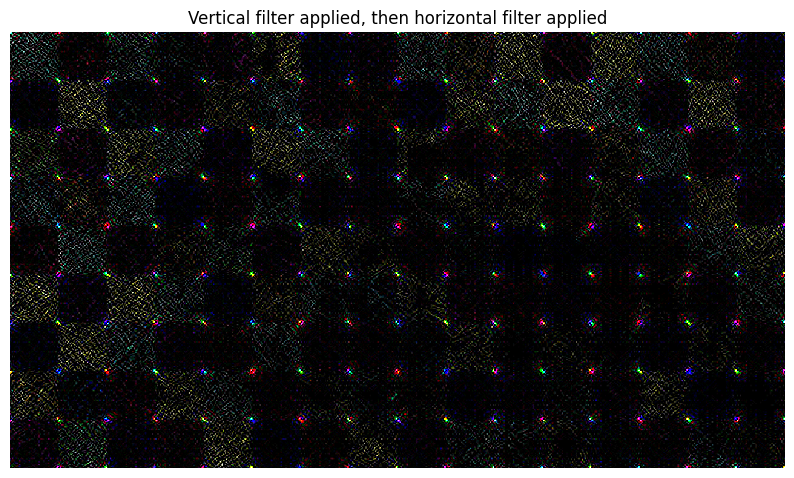

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.427450980392155..8.094117647058823].


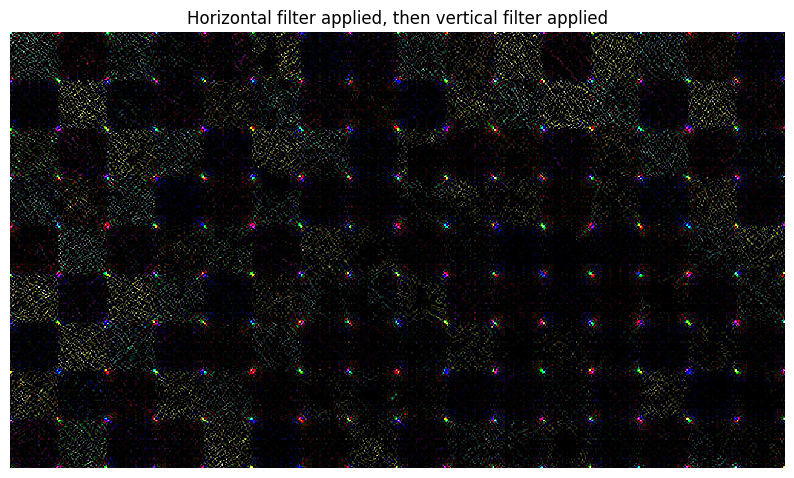

Application of horizontal filter then vertical filter results in the same image is False


In [71]:
out3_4 = conv(image2, horizontal_sobel_filter)
display(out3_4, "Horizontal filter applied")
out3_4 = conv(image2, vertical_sobel_filter)
display(out3_4, "Vertical filter applied")

out3_4 = conv(image2, vertical_sobel_filter)
out3_4 = conv(out3_4, horizontal_sobel_filter)
display(out3_4, "Vertical filter applied, then horizontal filter applied")

out3_4 = conv(image2, horizontal_sobel_filter)
out3_4 = conv(out3_4, vertical_sobel_filter)
display(out3_4, "Horizontal filter applied, then vertical filter applied")

print(f"Application of horizontal filter then vertical filter results in the same image is {np.array_equal(vertical_horizontal, horizontal_vertical)}")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.7019607843137257..3.6549019607843136].


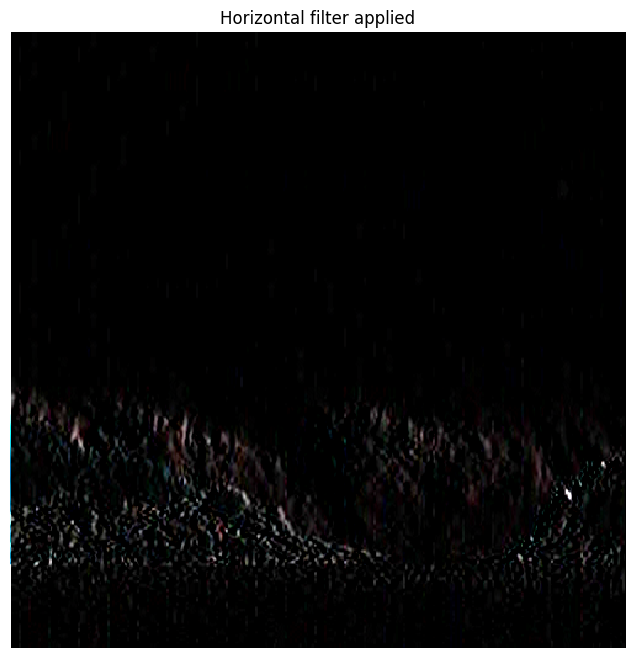

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.592156862745098..3.6549019607843136].


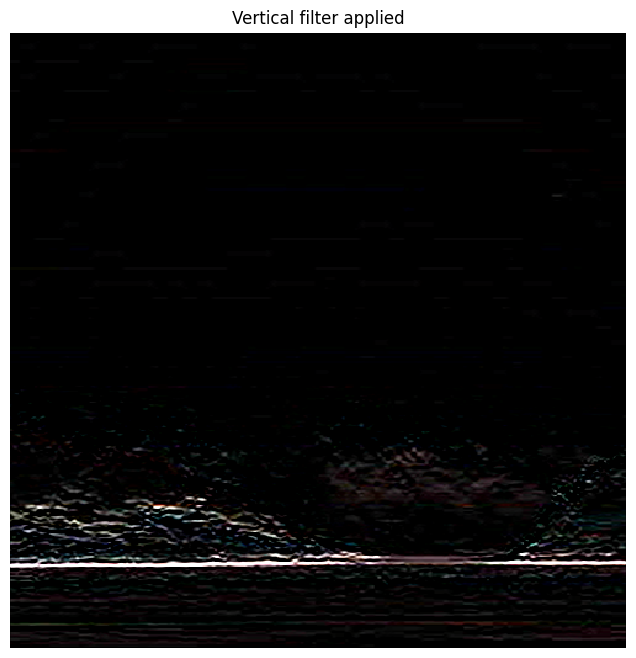

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.184313725490196..7.411764705882352].


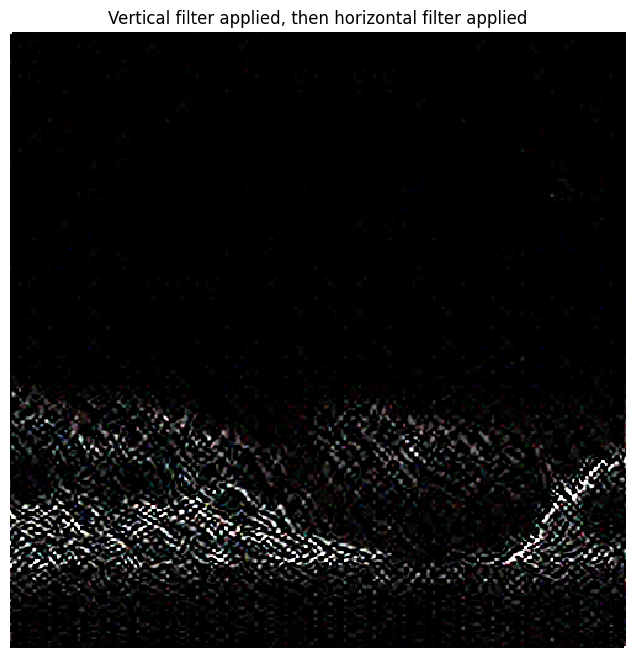

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.184313725490196..7.12156862745098].


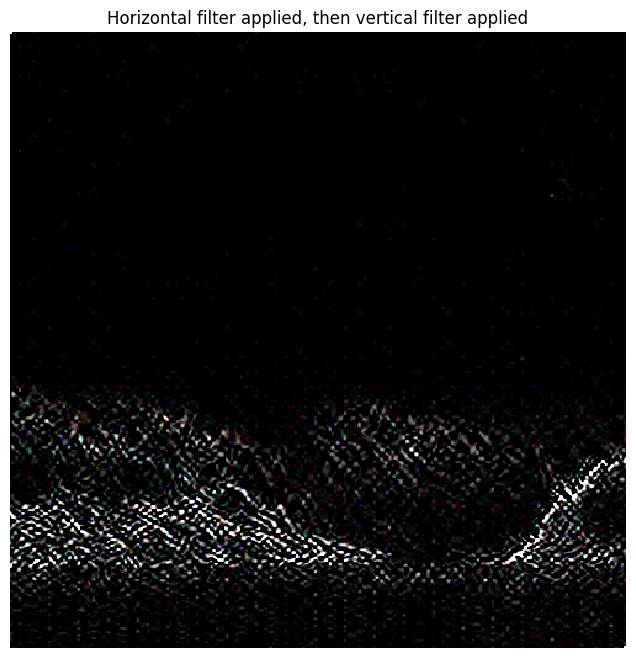

Application of horizontal filter then vertical filter results in the same image is False


In [72]:
out3_4 = conv(image3, horizontal_sobel_filter)
display(out3_4, "Horizontal filter applied")
out3_4 = conv(image3, vertical_sobel_filter)
display(out3_4, "Vertical filter applied")

out3_4 = conv(image3, vertical_sobel_filter)
out3_4 = conv(out3_4, horizontal_sobel_filter)
display(out3_4, "Vertical filter applied, then horizontal filter applied")

out3_4 = conv(image3, horizontal_sobel_filter)
out3_4 = conv(out3_4, vertical_sobel_filter)
display(out3_4, "Horizontal filter applied, then vertical filter applied")

print(f"Application of horizontal filter then vertical filter results in the same image is {np.array_equal(vertical_horizontal, horizontal_vertical)}")

### Question 3.4

Applying the Sobel filters over the three chosen images has selected the vertical and horizontal edges in these images.
Applying the horizontal Sobel filter is shown to select the vertical edges in the images, and applying the vertical
Sobel filter selects the horizontal edges in the images. This is most evident in the grid image, which when the vertical
filter is applied, can be outputted without the vertical grid lines, and when the horizontal filter is applied, is
outputted without the horizontal grid lines. The same is evident in the images of the mandrill and landscape.

We can also see that the combination of horizontal and vertical filters results in the selection of parts of the image
where the horizontal parts of the image and the vertical parts of the image interesct. This is most clearly seen in the
grid image, as the corners of each grid square are displayed. It also seems that the ordering of the application of both
horizontal and vertical filters is not important, since the resulting features displayed are similar. Although, a closer
inspection of both images produced proves that the exact pixel values are not the same, even though the displayed images
are very similar.

## Question 4: Image sampling and pyramids (35%)

### 4.1 Image Sampling

Apply your `resize()` function to reduce an image (I) to 0.5 height and width

Repeat the above procedure, but apply a Gaussian blur filter to your original image before downsampling it. How does the result compare to your previous output, and to the original image? Why?


### 4.2 Image Pyramids 
Creat a Gaussian pyramid as described in week2's lecture on an image.

Apply a Gaussian kernel to an image I, and resize it with ratio 0.5, to get $I_1$. Repeat this step to get $I_2$, $I_3$ and $I_4$.

Display these four images in a manner analogus to the example shown in the lectures.




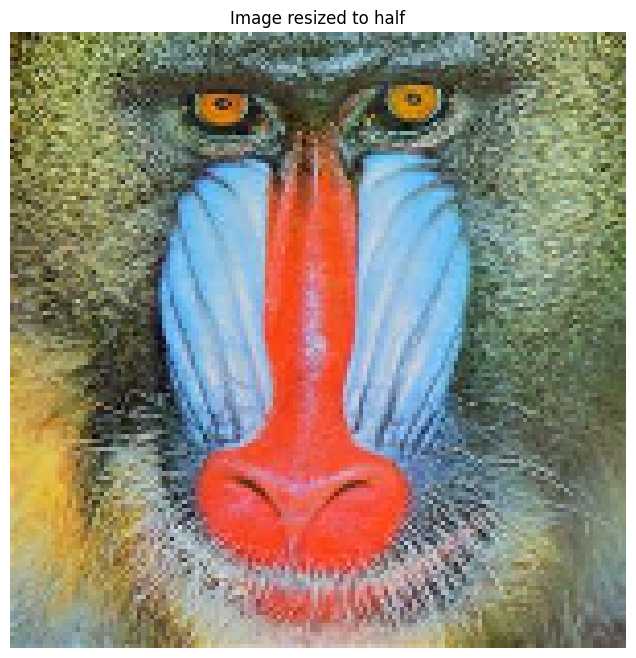

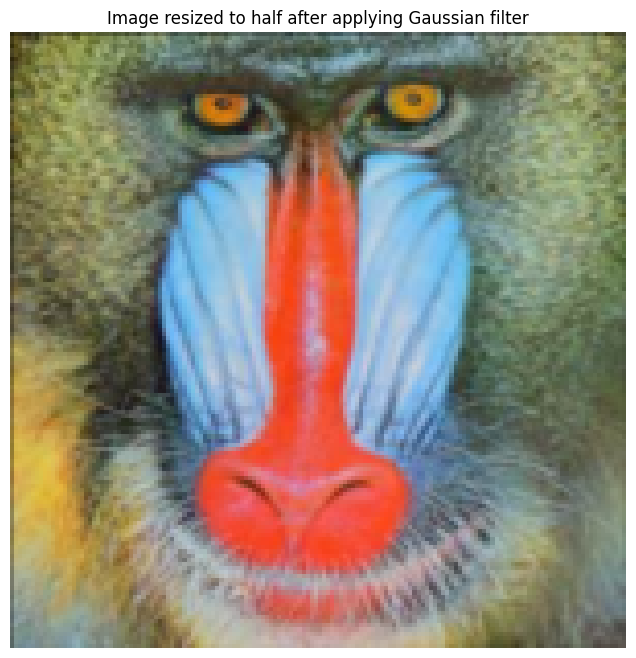

In [73]:
# 4.1
half_size_image = resize(image1, round(0.5 * image1.shape[0]), round(0.5 * image1.shape[1]))
display(half_size_image, "Image resized to half")

gauss_filter_4_1 = gauss2D(7, 1)
gaussian_img = conv(image1, gauss_filter_4_1)
half_size_gaussian_img = resize(gaussian_img, round(0.5 * image1.shape[0]), round(0.5 * image1.shape[1]))
display(half_size_gaussian_img, "Image resized to half after applying Gaussian filter")

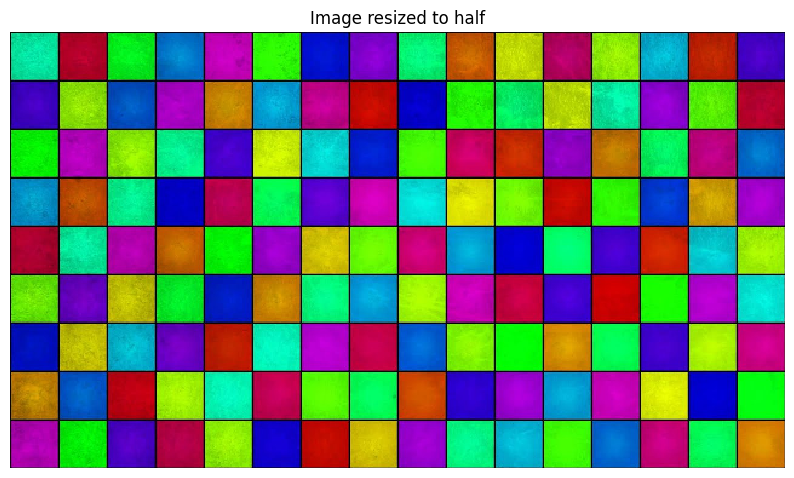

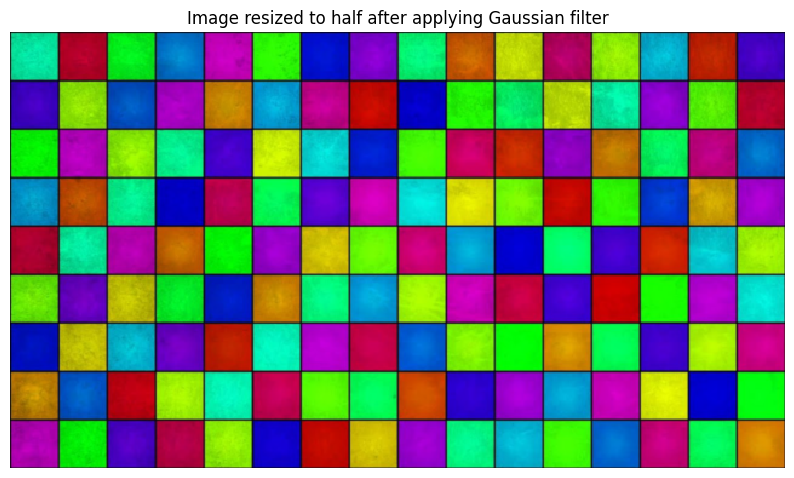

In [74]:
# 4.1
half_size_image = resize(image2, round(0.5 * image2.shape[0]), round(0.5 * image2.shape[1]))
display(half_size_image, "Image resized to half")

gauss_filter_4_1 = gauss2D(7, 1)
gaussian_img = conv(image2, gauss_filter_4_1)
half_size_gaussian_img = resize(gaussian_img, round(0.5 * image2.shape[0]), round(0.5 * image2.shape[1]))
display(half_size_gaussian_img, "Image resized to half after applying Gaussian filter")

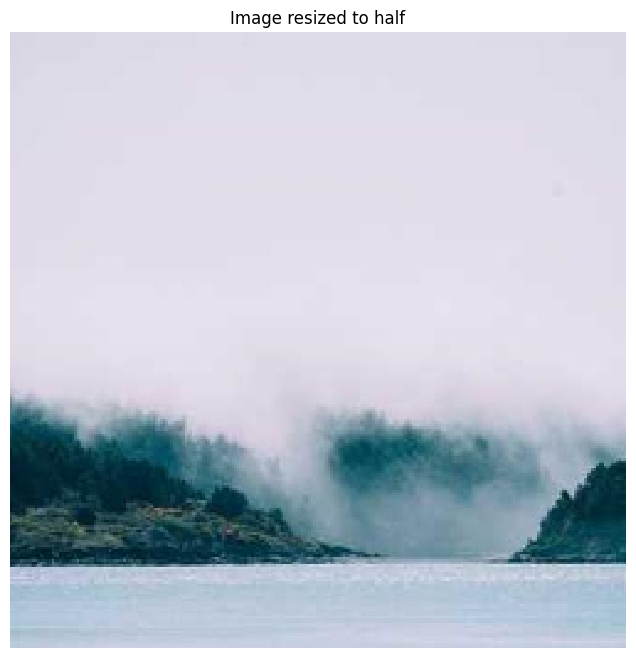

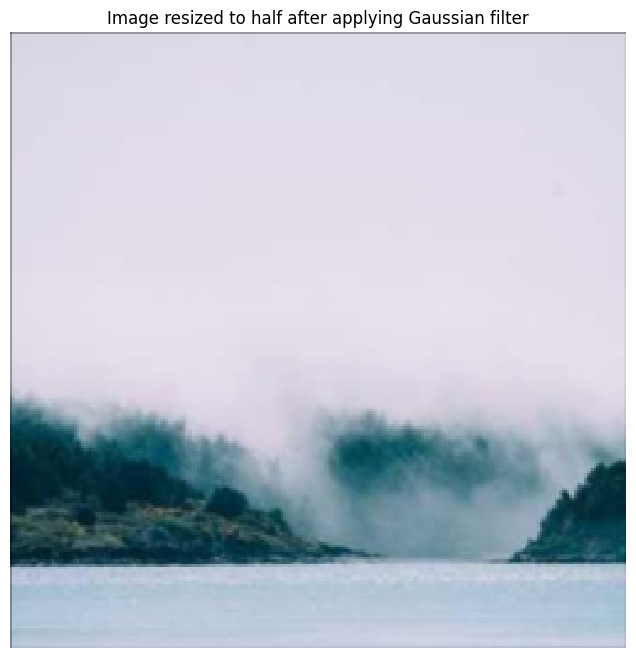

In [75]:
# 4.1
half_size_image = resize(image3, round(0.5 * image3.shape[0]), round(0.5 * image3.shape[1]))
display(half_size_image, "Image resized to half")

gauss_filter_4_1 = gauss2D(7, 1)
gaussian_img = conv(image3, gauss_filter_4_1)
half_size_gaussian_img = resize(gaussian_img, round(0.5 * image3.shape[0]), round(0.5 * image3.shape[1]))
display(half_size_gaussian_img, "Image resized to half after applying Gaussian filter")

### Question 4.1

After resizing the images both without and with applying a Gaussian filter beforehand, the differences become clear.
The image that has been resized without first applying a blur has become less clear because of the nearest neighbour
sampling method used in the resizing. When the resize is applied, the closest pixel is chosen to be a part of the
resized image.

However, when the Gaussian blur is applied to the image before the resize is first done, the nearest neighbour method
to choose what pixel values to apply is done using the already blurred image. This results in choosing pixels that are
closer in colour values to their neighbours because of the applied convolution. Overall, in the image that has been
resized, this results in a smoother output.

### Gaussian pyramid

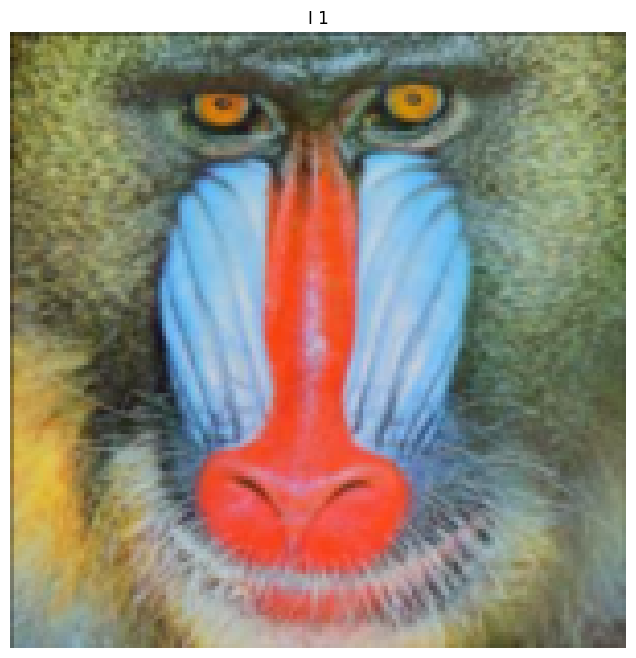

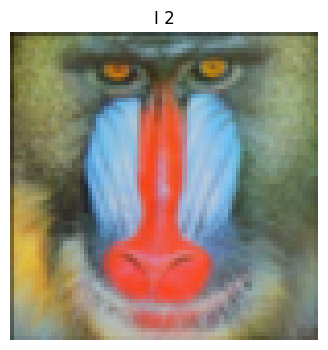

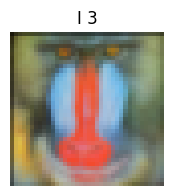

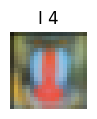

In [76]:
# 4.2
gauss_filter_4_2 = gauss2D(7, 1)
I = conv(image1, gauss_filter_4_2)
I_1 = resize(I, round(I.shape[0] / 2), round(I.shape[1] / 2))

I_2_g = conv(I_1, gauss_filter_4_2)
I_2 = resize(I_2_g, round(I_2_g.shape[0] / 2), round(I_2_g.shape[1] / 2))

I_3_g = conv(I_2, gauss_filter_4_2)
I_3 = resize(I_3_g, round(I_3_g.shape[0] / 2), round(I_3_g.shape[1] / 2))

I_4_g = conv(I_3, gauss_filter_4_2)
I_4 = resize(I_4_g, round(I_4_g.shape[0] / 2), round(I_4_g.shape[1] / 2))

display(I_1, "I 1")
display(I_2, "I 2", 0.5)
display(I_3, "I 3", 0.25)
display(I_4, "I 4", 0.125)

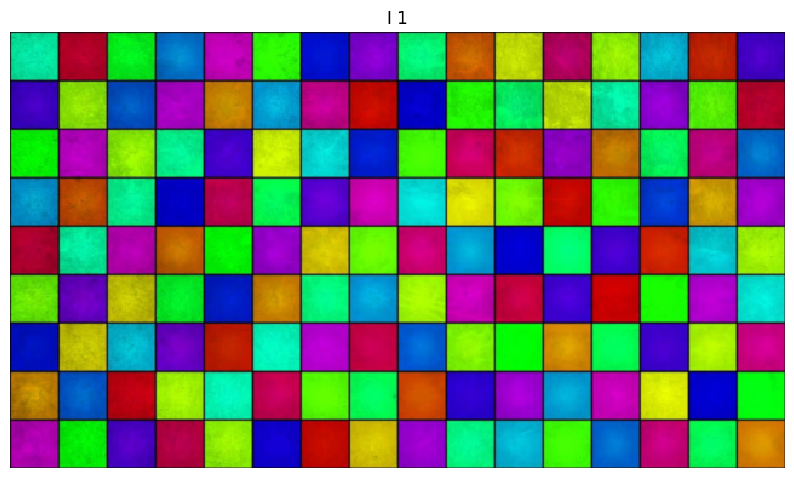

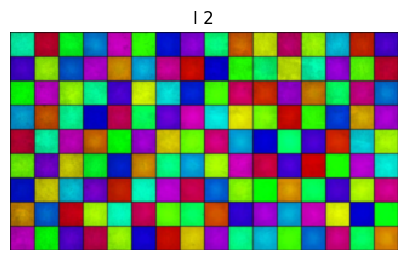

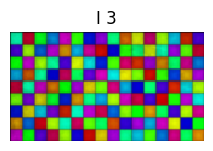

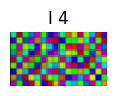

In [77]:
# 4.2
gauss_filter_4_2 = gauss2D(7, 1)
I = conv(image2, gauss_filter_4_2)
I_1 = resize(I, round(I.shape[0] / 2), round(I.shape[1] / 2))

I_2_g = conv(I_1, gauss_filter_4_2)
I_2 = resize(I_2_g, round(I_2_g.shape[0] / 2), round(I_2_g.shape[1] / 2))

I_3_g = conv(I_2, gauss_filter_4_2)
I_3 = resize(I_3_g, round(I_3_g.shape[0] / 2), round(I_3_g.shape[1] / 2))

I_4_g = conv(I_3, gauss_filter_4_2)
I_4 = resize(I_4_g, round(I_4_g.shape[0] / 2), round(I_4_g.shape[1] / 2))

display(I_1, "I 1")
display(I_2, "I 2", 0.5)
display(I_3, "I 3", 0.25)
display(I_4, "I 4", 0.125)

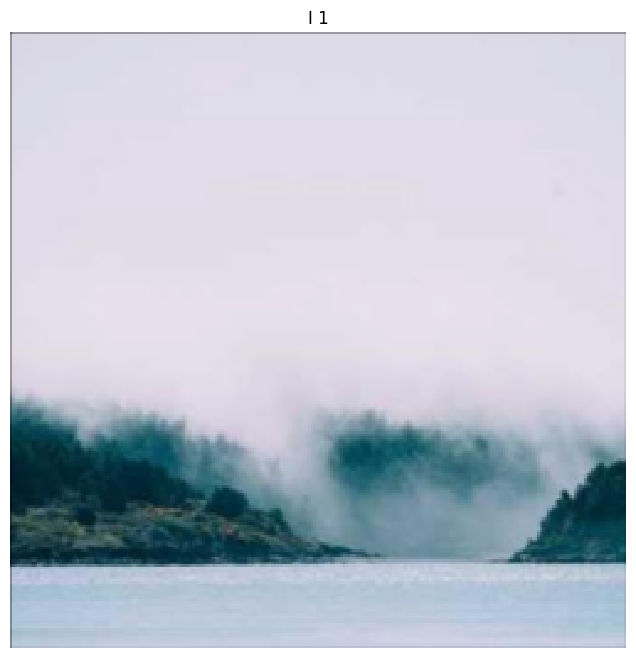

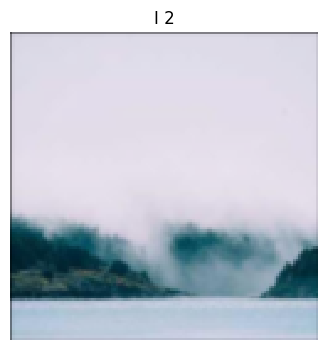

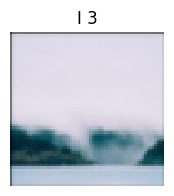

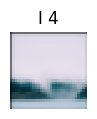

In [78]:
# 4.2
gauss_filter_4_2 = gauss2D(7, 1)
I = conv(image3, gauss_filter_4_2)
I_1 = resize(I, round(I.shape[0] / 2), round(I.shape[1] / 2))

I_2_g = conv(I_1, gauss_filter_4_2)
I_2 = resize(I_2_g, round(I_2_g.shape[0] / 2), round(I_2_g.shape[1] / 2))

I_3_g = conv(I_2, gauss_filter_4_2)
I_3 = resize(I_3_g, round(I_3_g.shape[0] / 2), round(I_3_g.shape[1] / 2))

I_4_g = conv(I_3, gauss_filter_4_2)
I_4 = resize(I_4_g, round(I_4_g.shape[0] / 2), round(I_4_g.shape[1] / 2))

display(I_1, "I 1")
display(I_2, "I 2", 0.5)
display(I_3, "I 3", 0.25)
display(I_4, "I 4", 0.125)

### Resized images without Gaussian blurring applied

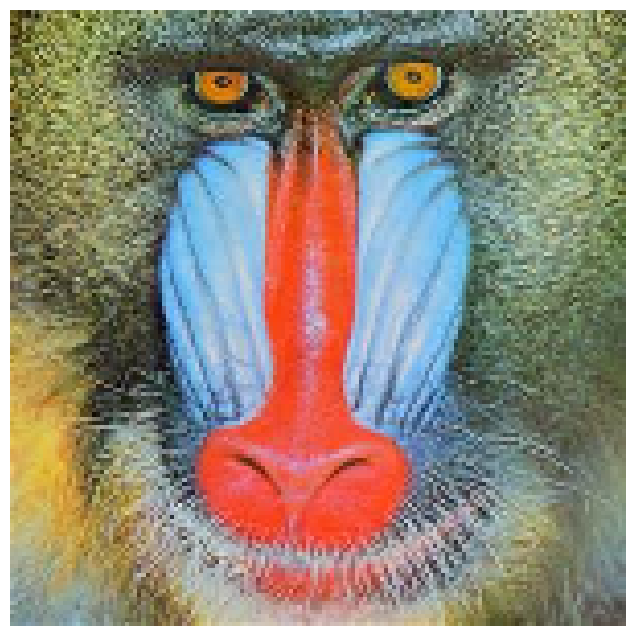

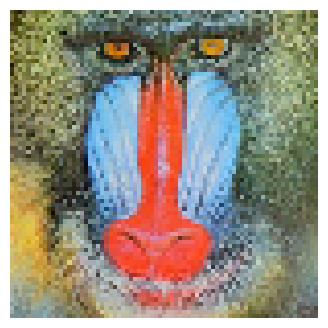

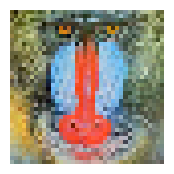

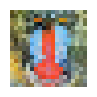

In [79]:
resized_1 = resize(image1, round(image1.shape[0] / 2), round(image1.shape[1] / 2))
resized_2 = resize(image1, round(image1.shape[0] / 4), round(image1.shape[1] / 4))
resized_3 = resize(image1, round(image1.shape[0] / 8), round(image1.shape[1] / 8))
resized_4 = resize(image1, round(image1.shape[0] / 16), round(image1.shape[1] / 16))

display(resized_1, "")
display(resized_2, "", 0.5)
display(resized_3, "", 0.25)
display(resized_4, "", 0.125)

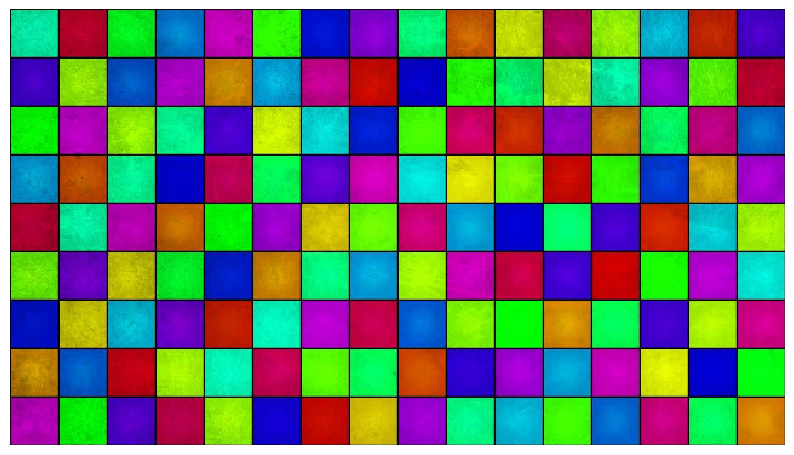

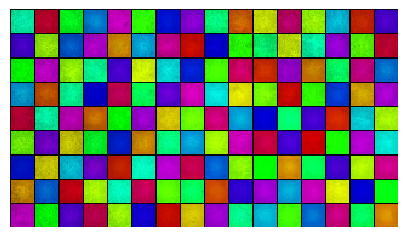

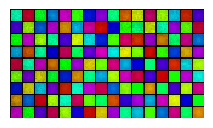

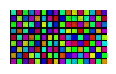

In [80]:
resized_1 = resize(image2, round(image2.shape[0] / 2), round(image2.shape[1] / 2))
resized_2 = resize(image2, round(image2.shape[0] / 4), round(image2.shape[1] / 4))
resized_3 = resize(image2, round(image2.shape[0] / 8), round(image2.shape[1] / 8))
resized_4 = resize(image2, round(image2.shape[0] / 16), round(image2.shape[1] / 16))

display(resized_1, "")
display(resized_2, "", 0.5)
display(resized_3, "", 0.25)
display(resized_4, "", 0.125)

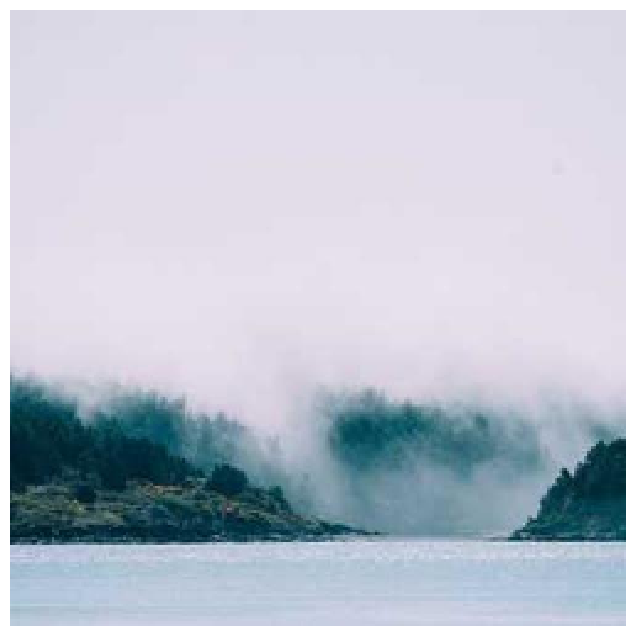

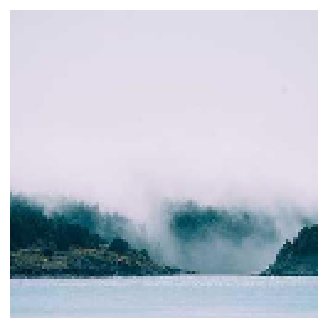

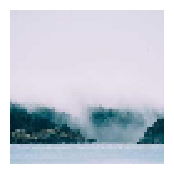

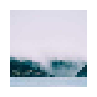

In [81]:
resized_1 = resize(image3, round(image3.shape[0] / 2), round(image3.shape[1] / 2))
resized_2 = resize(image3, round(image3.shape[0] / 4), round(image3.shape[1] / 4))
resized_3 = resize(image3, round(image3.shape[0] / 8), round(image3.shape[1] / 8))
resized_4 = resize(image3, round(image3.shape[0] / 16), round(image3.shape[1] / 16))

display(resized_1, "")
display(resized_2, "", 0.5)
display(resized_3, "", 0.25)
display(resized_4, "", 0.125)

### Question 4.2

In the output of the Gaussian pyramid, the image has been resized by a factor of $1/2$ in each level of the pyramid
after the Gaussian blur has been applied. When compared to the images that are shown under the heading "Resized images
without Gaussian blurring applied", it is clear that the images in the Gaussian pyramid are smoother, even at a much
smaller size.

## Question 5: Auto correlation (optional, unassessed)

Recall from week 2 that cross-correlation is a measure of similarity between a template and an image. It is defined similarly to convolution.

### 5.1 Correlation function

Implement the function `corr()` in a1code.py, based on your convolution function. Hint: numpy's `flip()` function may be useful here.

### 5.2 Auto-correlation

We will experiment with *auto-correlation*, where the template patch is taken from the image it is being compared to. Use a crop from your image as your template. Calculate the correlation of that template with every location in the image, and display the output as an image. Where is the maximum similarity? (Hint: numpy functions `argmax()` and `unravel()` will be useful here). For simplicity, you can use a greyscale version of the image and template.

Try this on an image with some symmetry, such as a person's face and crop the eye.


